# Introduction
This dataset has information about Telco customer and if they cancel subscription with the company in the past month. Each row represents data of a unique customer which can be identified by the customerID. 

**The data set includes:**

1.Telco_customer_churn_demographics.xlsx

2.Telco_customer_churn_location.xlsx

3.Telco_customer_churn_population.xlsx

4.Telco_customer_churn_services.xlsx

5.Telco_customer_churn_status.xlsx

## Merge data from different tables

In [1]:
#Merge done in Merge data.ipynb

In [2]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',False)

df = pd.DataFrame(pd.read_excel('./data/Merged Churn File.xlsx'))
df_service = pd.DataFrame(pd.read_excel('./data/Telco_customer_churn_services.xlsx'))


In [3]:
df_service = pd.merge(df_service, df[['Customer ID', 'Churn Value']], on='Customer ID', how='left')

In [4]:
column_to_drop_service = ['Customer ID','Count','Quarter','Offer']
df_service = df_service.drop(column_to_drop_service,axis=1)

In [5]:
charge_columns = ['Monthly Charge','Avg Monthly Long Distance Charges', 'Total Charges','Total Refunds',
                  'Total Extra Data Charges','Total Long Distance Charges','Total Revenue', 'Tenure in Months']

product_columns = ['Phone Service','Multiple Lines','Internet Service','Internet Type','Online Security','Online Backup',
                  'Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data']

billing_columns = ['Paperless Billing','Payment Method',]

other_columns = ['Referred a Friend','Number of Referrals',]

#Avg Monthly GB Download  Contract Churn Value

In [6]:
df1 = df_service[charge_columns]

dic={'dtype':[], 'num_uni':[],'uni_value':[],'uni_value_counts':[]}
for i in df1.columns:
    dtype=df1[i].dtype
    num_uni=df1[i].nunique()
    uni_value=df1[i].unique()
    uni_value_counts=df1[i].value_counts(sort=False).to_dict().values()
    dic['dtype'].append(dtype)
    dic['num_uni'].append(num_uni)
    dic['uni_value'].append(uni_value)
    dic['uni_value_counts'].append(uni_value_counts)
pd.DataFrame(dic,index=df1.columns)

,dtype,num_uni,uni_value,uni_value_counts
Monthly Charge,float64,1585,"[39.65, 80.65, 95.45, 98.5, 76.5, 78.05, 70.45...","(3, 7, 5, 4, 4, 2, 8, 10, 8, 5, 13, 16, 5, 2, ..."
Avg Monthly Long Distance Charges,float64,3584,"[0.0, 48.85, 11.33, 19.76, 6.33, 3.33, 15.28, ...","(682, 2, 1, 3, 4, 1, 3, 1, 4, 1, 3, 1, 2, 1, 2..."
Total Charges,float64,6540,"[39.65, 633.3, 1752.55, 2514.5, 2868.15, 2135....","(1, 1, 1, 1, 1, 1, 3, 2, 1, 2, 1, 1, 1, 1, 1, ..."
Total Refunds,float64,500,"[0.0, 45.61, 13.43, 40.95, 11.05, 29.84, 49.57...","(6518, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, ..."
Total Extra Data Charges,int64,16,"[20, 0, 10, 120, 140, 90, 80, 30, 100, 40, 110...","(51, 6315, 138, 28, 38, 35, 47, 58, 44, 62, 32..."
Total Long Distance Charges,float64,6110,"[0.0, 390.8, 203.94, 494.00000000000006, 234.2...","(682, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 2, 1, 1, 1..."
Total Revenue,float64,6996,"[59.65, 1024.1, 1910.88, 2995.07, 3102.36, 223...","(1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
Tenure in Months,int64,72,"[1, 8, 18, 25, 37, 27, 58, 15, 7, 11, 3, 13, 1...","(613, 123, 97, 79, 65, 72, 67, 99, 131, 99, 20..."


In [7]:
df2 = df_service[product_columns]

dic={'dtype':[], 'num_uni':[],'uni_value':[],'uni_value_counts':[]}
for i in df2.columns:
    dtype=df2[i].dtype
    num_uni=df2[i].nunique()
    uni_value=df2[i].unique()
    uni_value_counts=df2[i].value_counts(sort=False).to_dict().values()
    dic['dtype'].append(dtype)
    dic['num_uni'].append(num_uni)
    dic['uni_value'].append(uni_value)
    dic['uni_value_counts'].append(uni_value_counts)
pd.DataFrame(dic,index=df2.columns)

,dtype,num_uni,uni_value,uni_value_counts
Phone Service,object,2,"[No, Yes]","(682, 6361)"
Multiple Lines,object,2,"[No, Yes]","(4072, 2971)"
Internet Service,object,2,"[Yes, No]","(5517, 1526)"
Internet Type,object,4,"[DSL, Fiber Optic, Cable, None]","(1652, 3035, 830, 1526)"
Online Security,object,2,"[No, Yes]","(5024, 2019)"
Online Backup,object,2,"[No, Yes]","(4614, 2429)"
Device Protection Plan,object,2,"[Yes, No]","(2422, 4621)"
Premium Tech Support,object,2,"[No, Yes]","(4999, 2044)"
Streaming TV,object,2,"[No, Yes]","(4336, 2707)"
Streaming Movies,object,2,"[Yes, No]","(2732, 4311)"


In [169]:
df['Avg Extra Data Charge']= df['Total Extra Data Charges'] / df['Tenure in Months']

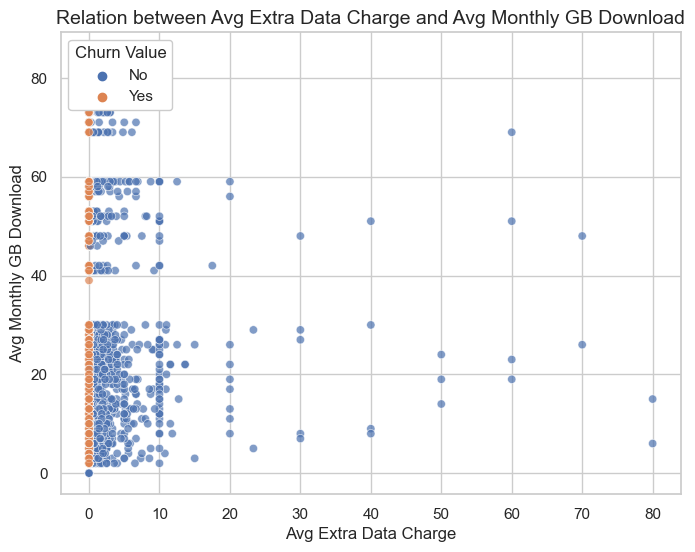

In [172]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['Avg Extra Data Charge'], y=df['Avg Monthly GB Download'], hue=df['Unlimited Data'], alpha=0.7)
plt.title('Relation between Avg Extra Data Charge and Avg Monthly GB Download',fontsize=14)
plt.xlabel('Avg Extra Data Charge')
plt.ylabel('Avg Monthly GB Download')
plt.legend(title='Churn Value', frameon=True, framealpha=1, loc='upper left')  # Add frame to the legend
plt.show()

In [9]:
df_service.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Referred a Friend                  7043 non-null   object 
 1   Number of Referrals                7043 non-null   int64  
 2   Tenure in Months                   7043 non-null   int64  
 3   Phone Service                      7043 non-null   object 
 4   Avg Monthly Long Distance Charges  7043 non-null   float64
 5   Multiple Lines                     7043 non-null   object 
 6   Internet Service                   7043 non-null   object 
 7   Internet Type                      7043 non-null   object 
 8   Avg Monthly GB Download            7043 non-null   int64  
 9   Online Security                    7043 non-null   object 
 10  Online Backup                      7043 non-null   object 
 11  Device Protection Plan             7043 non-null   objec

In [163]:
df[df['Contract']!="Month-to-Month"]['Monthly Charge'].mean()


63.89468394989805

In [161]:
df['Contract'].value_counts()

Month-to-Month    3610
Two Year          1883
One Year          1550
Name: Contract, dtype: int64

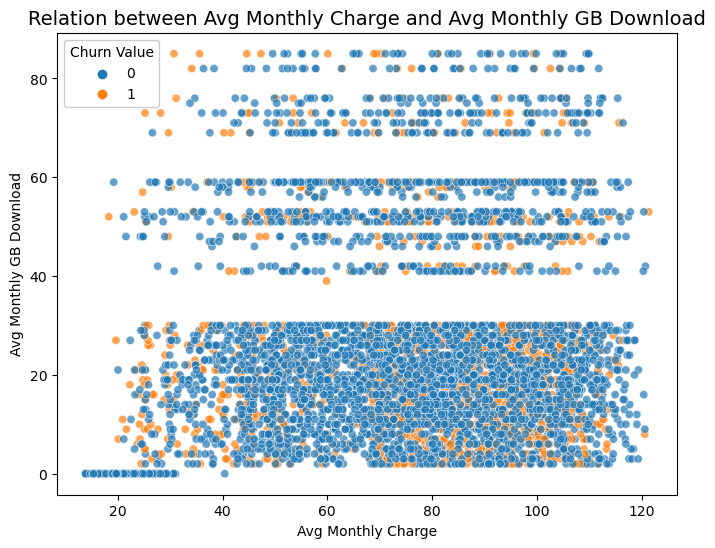

In [10]:
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline


plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_service['avg monthly charge'], y=df_service['Avg Monthly GB Download'], hue=df_service['Churn Value'], alpha=0.7)
plt.title('Relation between Avg Monthly Charge and Avg Monthly GB Download',fontsize=14)
plt.xlabel('Avg Monthly Charge')
plt.ylabel('Avg Monthly GB Download')
plt.legend(title='Churn Value', frameon=True, framealpha=1, loc='upper left')  # Add frame to the legend
plt.show()


In [11]:
import plotly.express as px

# Assuming df_service and df are your DataFrames
fig = px.scatter(x=df_service['avg monthly charge'], y=df['Avg Monthly GB Download'], color=df['Churn Value'],
                 opacity=0.7, labels={'x': 'Avg Monthly Charge', 'y': 'Avg Monthly GB Download'},
                 title='Relation between Avg Monthly Charge and Avg Monthly GB Download',
                 color_continuous_scale=px.colors.diverging.Portland)

fig.show()


In [12]:
df['Unlimited Data'].value_counts()

Yes    4745
No     2298
Name: Unlimited Data, dtype: int64

In [13]:
df_service.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Referred a Friend                  7043 non-null   object 
 1   Number of Referrals                7043 non-null   int64  
 2   Tenure in Months                   7043 non-null   int64  
 3   Phone Service                      7043 non-null   object 
 4   Avg Monthly Long Distance Charges  7043 non-null   float64
 5   Multiple Lines                     7043 non-null   object 
 6   Internet Service                   7043 non-null   object 
 7   Internet Type                      7043 non-null   object 
 8   Avg Monthly GB Download            7043 non-null   int64  
 9   Online Security                    7043 non-null   object 
 10  Online Backup                      7043 non-null   object 
 11  Device Protection Plan             7043 non-null   objec

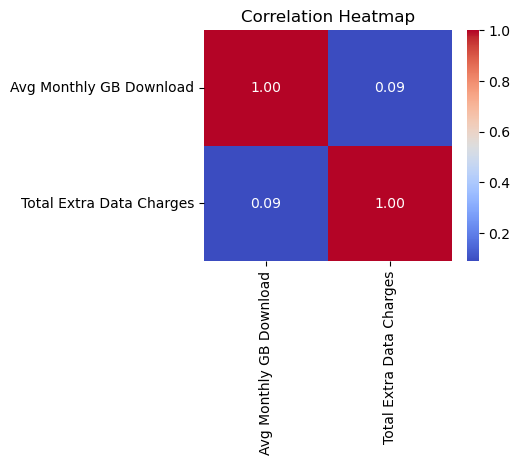

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming df_service is your DataFrame
corr_matrix = df_service[['Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Avg Monthly GB Download', 'Total Extra Data Charges']].corr()

plt.figure(figsize=(4, 3))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

## Basic information

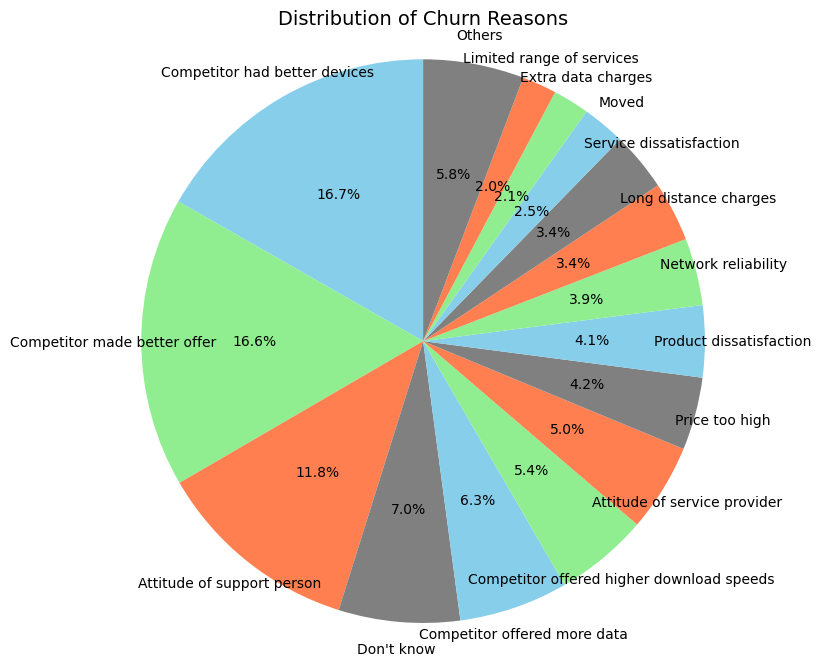

In [15]:

value_counts = df['Churn Reason'].value_counts()
threshold = 35
filtered_value_counts = value_counts[value_counts >= threshold]
# Create a new category 'Others' for smaller counts
others_count = value_counts[value_counts < threshold].sum()
filtered_value_counts['Others'] = others_count

# Plotting the pie chart
fig, ax = plt.subplots(figsize=(8, 8))  # Adjust the figure size
wedges, texts, autotexts = ax.pie(filtered_value_counts,labels=filtered_value_counts.index,autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'coral','gray'])

# Set aspect ratio to be equal to ensure a circular pie chart
ax.axis('equal')

# Add a title
ax.set_title('Distribution of Churn Reasons',fontsize=14)

# Adjust the label positions to avoid overlap
for text, autotext in zip(texts, autotexts):
    text.set_horizontalalignment('center')
    autotext.set_horizontalalignment('center')

# Show the pie chart
plt.show()

In [16]:
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline


In [17]:
def distplot(feature, frame, color='deepskyblue'):
    plt.figure(figsize=(6,4))
    plt.title("Distribution for {}".format(feature), fontsize=14)
    ax = sns.distplot(frame[feature], color= color)

num_cols = ['Tenure in Months', 'Monthly Charge', 'Total Charges']
#num_cols = [ 'Monthly Charge', 'Total Charges']
df[num_cols].describe()

,Tenure in Months,Monthly Charge,Total Charges
count,7043.000000,7043.000000,7043.000000
mean,32.386767,64.761692,2280.381264
std,24.542061,30.090047,2266.220462
min,1.000000,18.250000,18.800000
25%,9.000000,35.500000,400.150000
50%,29.000000,70.350000,1394.550000
75%,55.000000,89.850000,3786.600000
max,72.000000,118.750000,8684.800000


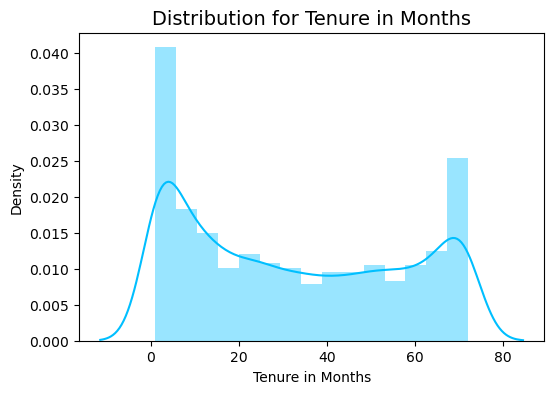

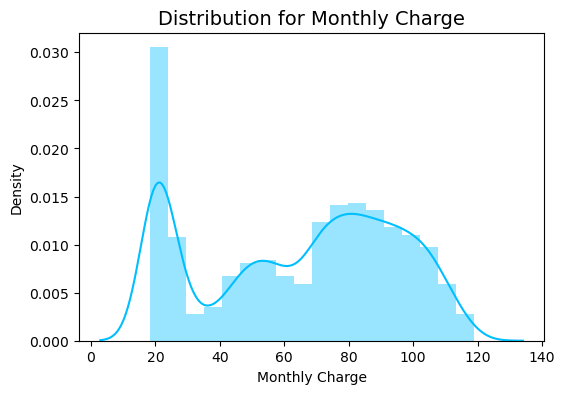

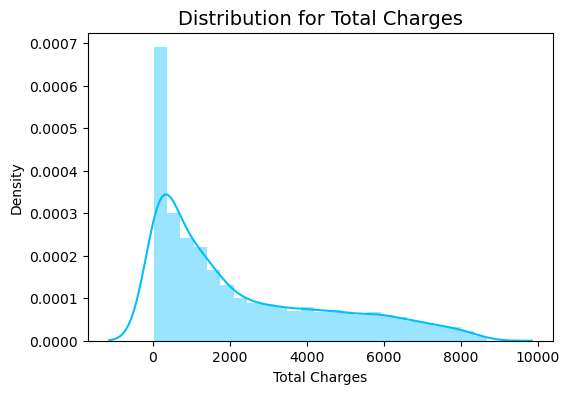

In [18]:
for feat in num_cols: distplot(feat, df[num_cols])

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 53 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Under 30                           7043 non-null   object 
 4   Senior Citizen                     7043 non-null   object 
 5   Married                            7043 non-null   object 
 6   Dependents                         7043 non-null   object 
 7   Number of Dependents               7043 non-null   int64  
 8   Country                            7043 non-null   object 
 9   State                              7043 non-null   object 
 10  City                               7043 non-null   object 
 11  Zip Code                           7043 non-null   int64

# EDA (Exploratory Data Analysis)

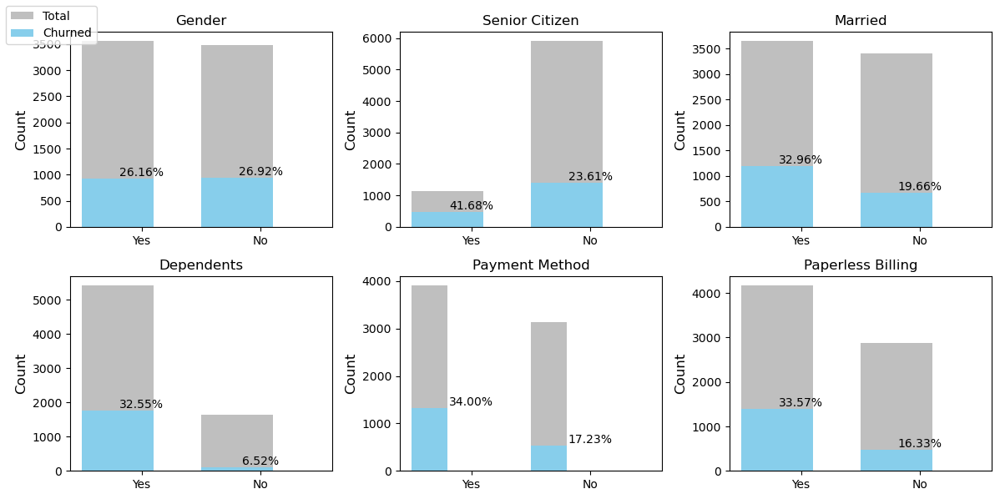

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_churn_rate_by_category(ax, df, column):
    total_values = df[column]
    churn_values = df['Churn Value']

    # Specify the order of the unique values in the 'Churned' and 'Total' labels
    order = ['Yes', 'No']

    hist_total, bin_edges, _ = ax.hist(x=total_values, bins=len(order), alpha=0.5, label='Total', color='gray', width=0.3)
    hist_churn, _, _ = ax.hist(x=total_values[churn_values == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue', width=0.3)

    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    ratios = hist_churn / hist_total

    for i, ratio in enumerate(ratios):
        ax.text(bin_centers[i], hist_churn[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

   # ax.set_xlabel(column, fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.set_title(f'{column}', fontsize=12)
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(order)  # Set the order of the labels in the middle of the bins

# List of categorical columns
demographic_columns = ['Gender', 'Senior Citizen', 'Married', 'Dependents', 'Payment Method', 'Paperless Billing']

# Create subplots
fig, axs = plt.subplots(2,3, figsize=(12,6))
axs = axs.flatten()

# Loop through the columns and plot churn rate
for i, column in enumerate(demographic_columns):
    plot_churn_rate_by_category(axs[i], df, column)
    
# Add a common legend for the entire chart
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



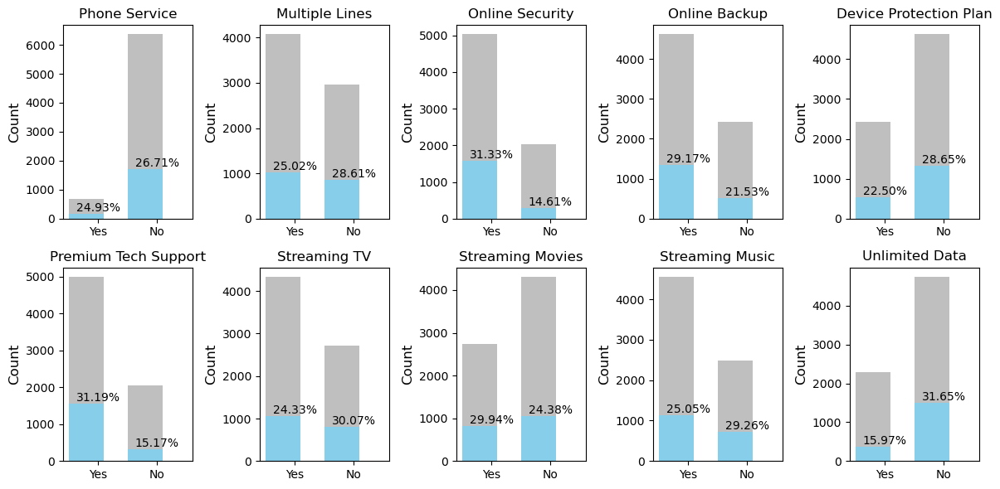

In [21]:
demographic_columns = ['Phone Service','Multiple Lines','Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                         'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data']

# Create subplots
fig, axs = plt.subplots(2,5, figsize=(12,6))
axs = axs.flatten()

# Loop through the columns and plot churn rate
for i, column in enumerate(demographic_columns):
    plot_churn_rate_by_category(axs[i], df, column)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [22]:
df['Churn Value'].value_counts()

0    5174
1    1869
Name: Churn Value, dtype: int64

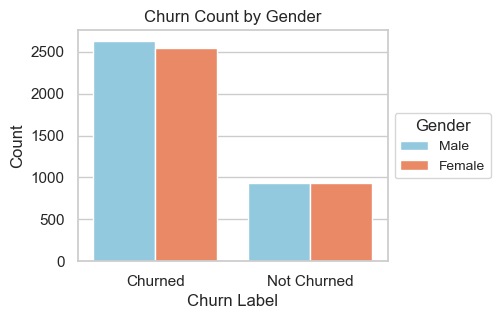

In [23]:
sns.set(style="whitegrid")
plt.figure(figsize=(4, 3))

sns.countplot(x='Churn Value', hue='Gender', data=df, palette=['skyblue', 'coral'])  #palette='pastel')
plt.title('Churn Count by Gender')
plt.xticks([0,1], ['Churned', 'Not Churned'])
plt.xlabel('Churn Label')
plt.ylabel('Count')
plt.legend(title='Gender', loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')

#plt.show

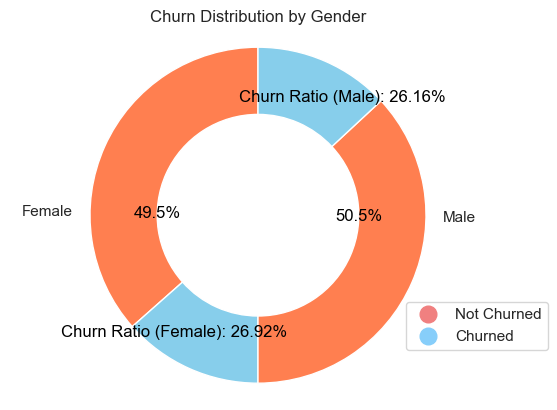

In [24]:
import matplotlib.pyplot as plt

# Assuming 'Gender' is a column with values 'Male' and 'Female'
# Replace 'Churn Value' with the actual column name in your DataFrame
gender_churn = df.groupby(['Gender', 'Churn Value']).size().unstack()

# Calculate the percentages of Male and Female
percentage_gender = gender_churn.sum(axis=1) / gender_churn.sum().sum()

# Calculate the percentages of Churn Value 1 and 0 within each gender group
percentage_churn = gender_churn.div(gender_churn.sum(axis=1), axis=0)

# Plotting the nested pie chart
fig, ax = plt.subplots()

# Outer pie chart (Gender)
wedges_gender, text_gender, autotext_gender = ax.pie(percentage_gender, labels=percentage_gender.index, autopct='%1.1f%%', startangle=90, colors=['lightcoral', 'lightskyblue'], wedgeprops=dict(width=0.3))

# Set the text color of the outer pie chart to be black
for text in autotext_gender:
    text.set_color('black')

# Inner pie chart (Churn Value within each gender)
colors_churn = [['coral', 'skyblue'][j] for j in range(gender_churn.shape[1])]
wedges_churn, text_churn, autotext_churn = ax.pie(percentage_churn.values.flatten(), autopct='', startangle=90, colors=colors_churn, wedgeprops=dict(width=0.4))

# Set the text color of the inner pie chart to be black
for text in autotext_churn:
    text.set_color('grey')

# Add text labels with the ratio of Churn Value 1 and 0 within each gender group
ratio_female_churn1 = gender_churn.loc['Female', 1] / gender_churn.loc['Female'].sum()
ratio_male_churn1 = gender_churn.loc['Male', 1] / gender_churn.loc['Male'].sum()

ax.text(-0.5, -0.7, f'Churn Ratio (Female): {ratio_female_churn1:.2%}', fontsize=12, ha='center', va='center', color='black')
ax.text(0.5, 0.7, f'Churn Ratio (Male): {ratio_male_churn1:.2%}', fontsize=12, ha='center', va='center', color='black')

# Set aspect ratio to be equal for a circular pie chart
ax.axis('equal')

# Add a legend with correct labels
legend_labels_churn = ['Not Churned', 'Churned']
legend_handles_churn = [
    plt.Line2D([0], [0], marker='o', color=color, markerfacecolor=color, markersize=12, linestyle='None') 
    for color in ['lightcoral', 'lightskyblue']
]
ax.legend(legend_handles_churn, legend_labels_churn, title='', loc='center right', bbox_to_anchor=(1.1, 0.2))


plt.title('Churn Distribution by Gender')
plt.show()


In [25]:
# Number of bins for hist
import math
n=math.log(7043)+1
print(n)

9.85978949474541


In [ ]:
total_charges = df['Monthly Charge']
churn_value = df['Churn Value']

# Create a histogram for 'Total'
hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=6, alpha=0.5, label='Total', color='lightgrey')

# Create a histogram for 'Churn Value 1'
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')

# Calculate the midpoint of each bin
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# Calculate the ratio of 'Churn Value 1' counts to total counts for each bin
ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=12)

plt.xlabel('Total Charges')
plt.ylabel('Frequency')
plt.title('Total Charges V.S. Churn Rate')
plt.legend()
plt.show()

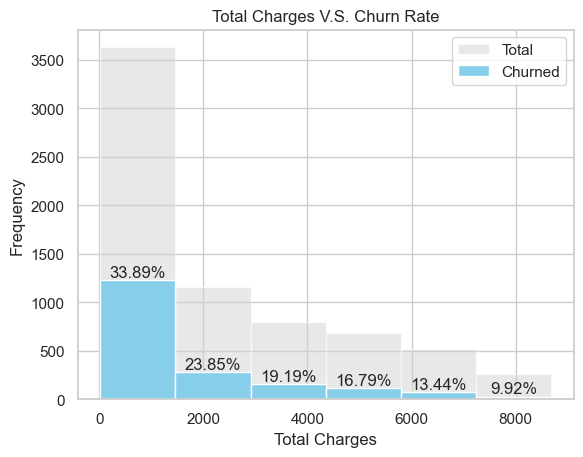

In [26]:
total_charges = df['Total Charges']
churn_value = df['Churn Value']

# Create a histogram for 'Total'
hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=6, alpha=0.5, label='Total', color='lightgrey')

# Create a histogram for 'Churn Value 1'
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')

# Calculate the midpoint of each bin
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# Calculate the ratio of 'Churn Value 1' counts to total counts for each bin
ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=12)

plt.xlabel('Total Charges')
plt.ylabel('Frequency')
plt.title('Total Charges V.S. Churn Rate')
plt.legend()
plt.show()

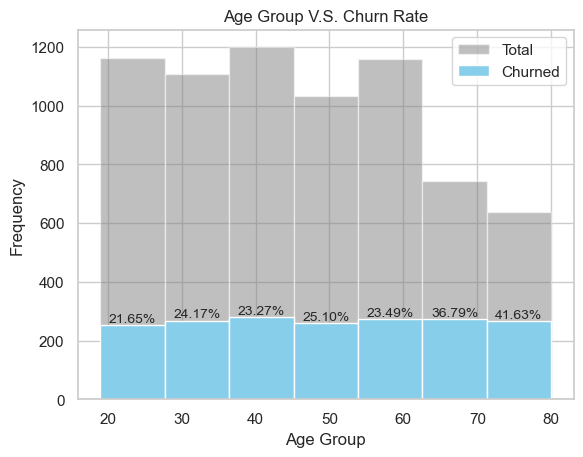

In [27]:
total_charges = df['Age']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=7, alpha=0.5, label='Total', color='gray')
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Age Group', fontsize=12 )
plt.ylabel('Frequency', fontsize=12)
plt.title('Age Group V.S. Churn Rate', fontsize=12)
plt.legend()
plt.show()

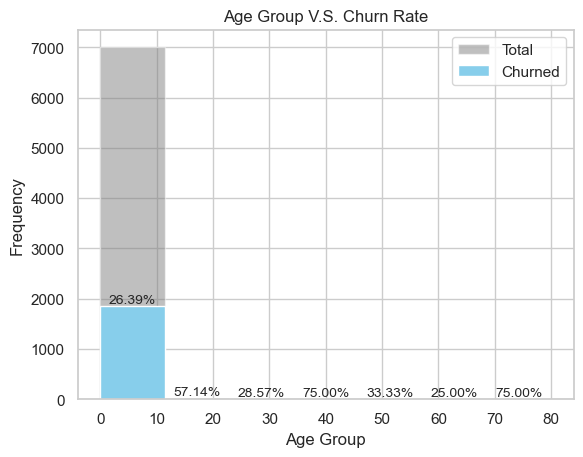

In [176]:
total_charges = df['Avg Extra Data Charge']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=7, alpha=0.5, label='Total', color='gray')
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Age Group', fontsize=12 )
plt.ylabel('Frequency', fontsize=12)
plt.title('Age Group V.S. Churn Rate', fontsize=12)
plt.legend()
plt.show()

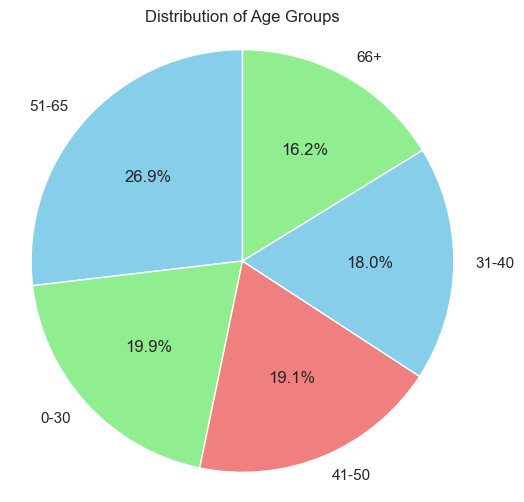

In [28]:
# Define age bins
age_bins = [0, 30, 40, 50, 65, float('inf')]  # Adjust the bin edges as needed
age_labels = ['0-30', '31-40', '41-50', '51-65', '66+']

# Create a new column 'Age Group' based on bins
df['Age Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

# Calculate value counts for each age group
age_group_counts = df['Age Group'].value_counts()

# Plotting the pie chart
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(age_group_counts, labels=age_group_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'lightcoral'])

# Set aspect ratio to be equal to ensure a circular pie chart
ax.axis('equal')

# Add a title
ax.set_title('Distribution of Age Groups')

# Show the pie chart
plt.show()


In [29]:
# Calculate total count of each age group
total_count = df['Age Group'].value_counts().reset_index()
total_count.columns = ['Age Group', 'Total Count']

# Group by 'Age Group' and calculate counts of non-NaN values
result = df.groupby('Age Group')['Churn Reason'].agg(['count', lambda x: x.notna().sum()])
result = result.drop('<lambda_0>', axis=1)

# Merge the total count with the result
result = pd.merge(total_count, result, left_on='Age Group', right_index=True)

# Rename the columns for clarity
result.columns = ['Age Group', 'Total Count', 'Total Non-NaN Count']

# Print the result
print(result)

  Age Group  Total Count  Total Non-NaN Count
0     51-65         1892                  462
1      0-30         1401                  304
2     41-50         1342                  318
3     31-40         1266                  309
4       66+         1142                  476


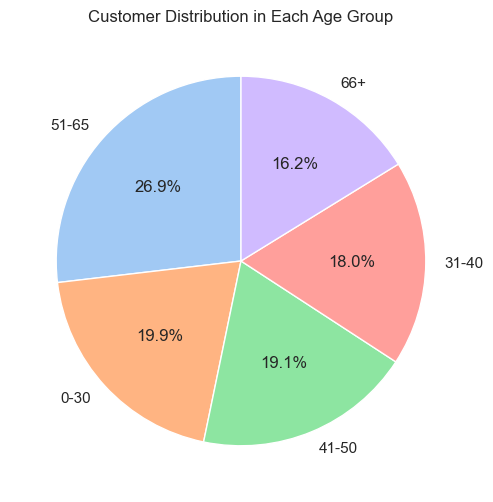

In [30]:
# Calculate the ratio of NaN churn reasons to total counts
result['NaN Ratio'] = result['Total Non-NaN Count'] / result['Total Count']

pastel_palette = sns.color_palette("pastel")
# Plotting the pie chart
fig, ax = plt.subplots(figsize=(6,6),dpi=100)
wedges, texts, autotexts = ax.pie(result['Total Count'], labels=result['Age Group'],
                                  autopct='%1.1f%%', startangle=90, colors=pastel_palette)

# Add a title
ax.set_title('Customer Distribution in Each Age Group')

# Show the pie chart
plt.show()



In [121]:
import plotly.express as px

churn_pm = df.assign(churn_clients = np.where(df['Churn Value']== 1,df['Customer ID'],None))\
   .groupby(['Age Group','Internet Service']).agg({'churn_clients':'count'}).reset_index()
pm_clients = df.groupby(['Age Group','Internet Service'])['Customer ID'].count().reset_index()
pm_data = pm_clients.join(churn_pm.set_index(['Age Group','Internet Service']), on=['Age Group','Internet Service'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients']/pm_data['Customer ID']) * 100),2)
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Age Group',
             facet_col = 'Internet Service',
             color = 'churn_rate,%',
             text = 'churn_rate,%',
             color_continuous_scale='Blues')

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray',  # Background color of the paper (area outside the plot)
    yaxis=dict(categoryorder='array', categoryarray=age_labels)  # Set category order for y-axis
)
fig.show()

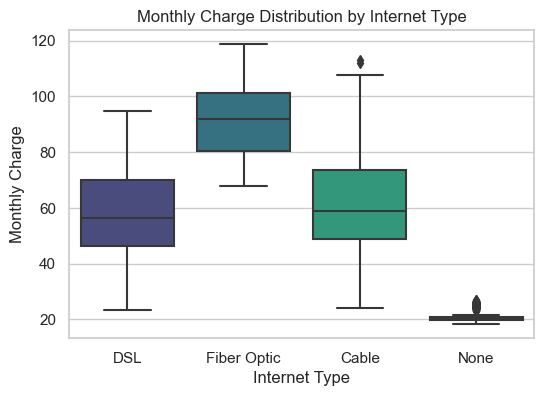

In [120]:
sns.set(style="whitegrid")

# Create a box plot
plt.figure(figsize=(6,4))
sns.boxplot(x='Internet Type', y='Monthly Charge', data=df, palette='viridis')

# Add labels and title
plt.xlabel('Internet Type')
plt.ylabel('Monthly Charge')
plt.title('Monthly Charge Distribution by Internet Type')

# Show the plot
plt.show()

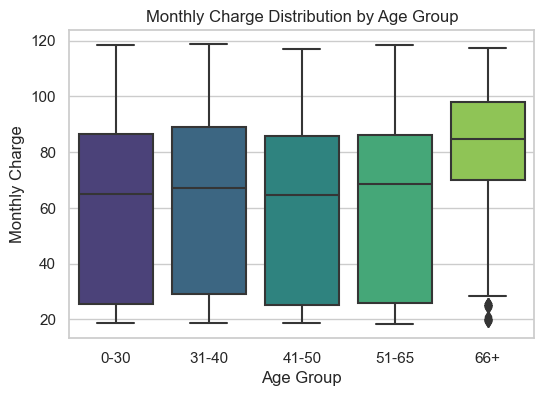

In [32]:
sns.set(style="whitegrid")

# Create a box plot
plt.figure(figsize=(6,4))
sns.boxplot(x='Age Group', y='Monthly Charge', data=df, palette='viridis')

# Add labels and title
plt.xlabel('Age Group')
plt.ylabel('Monthly Charge')
plt.title('Monthly Charge Distribution by Age Group')

# Show the plot
plt.show()

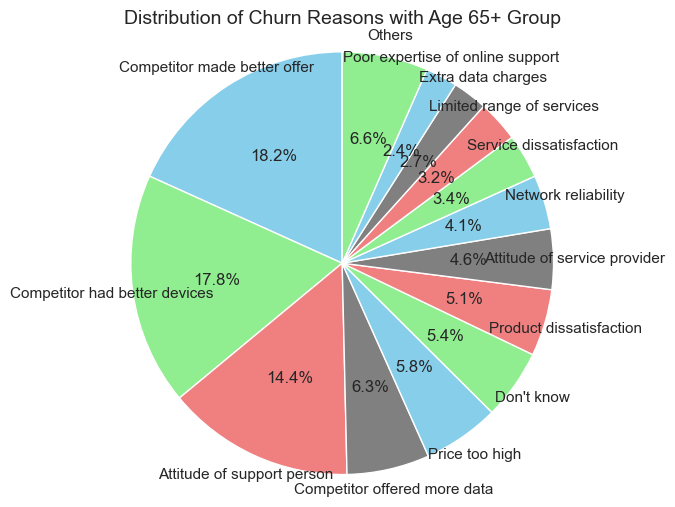

In [143]:
df_over_70 = df[df['Age']>65]
df_over_70=df_over_70[df['Contract']=='Month-to-Month']
value_counts = df_over_70['Churn Reason'].value_counts()
threshold =10
filtered_value_counts = value_counts[value_counts >= threshold]
# Create a new category 'Others' for smaller counts
others_count = value_counts[value_counts < threshold].sum()
filtered_value_counts['Others'] = others_count

# Plotting the pie chart
fig, ax = plt.subplots(figsize=(6, 6))  # Adjust the figure size
wedges, texts, autotexts = ax.pie(filtered_value_counts,labels=filtered_value_counts.index,autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'lightcoral','gray'])

# Set aspect ratio to be equal to ensure a circular pie chart
ax.axis('equal')

# Add a title
ax.set_title('Distribution of Churn Reasons with Age 65+ Group',fontsize=14)

# Adjust the label positions to avoid overlap
for text, autotext in zip(texts, autotexts):
    text.set_horizontalalignment('center')
    autotext.set_horizontalalignment('center')

# Show the pie chart
plt.show()

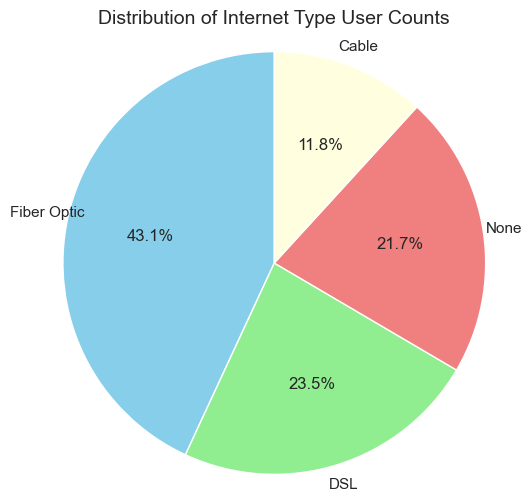

In [34]:
value_counts = df['Internet Type'].value_counts()
threshold = 0
filtered_value_counts = value_counts[value_counts >= threshold]
# Create a new category 'Others' for smaller counts
others_count = value_counts[value_counts < threshold].sum()
#filtered_value_counts['Others'] = others_count

# Plotting the pie chart
fig, ax = plt.subplots(figsize=(6, 6))  # Adjust the figure size
wedges, texts, autotexts = ax.pie(filtered_value_counts,labels=filtered_value_counts.index,autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'lightcoral','lightyellow'])

# Set aspect ratio to be equal to ensure a circular pie chart
ax.axis('equal')

# Add a title
ax.set_title('Distribution of Internet Type User Counts',fontsize=14)

# Adjust the label positions to avoid overlap
for text, autotext in zip(texts, autotexts):
    text.set_horizontalalignment('center')
    autotext.set_horizontalalignment('center')

# Show the pie chart
plt.show()

In [35]:
df['Internet Type'].value_counts()

Fiber Optic    3035
DSL            1652
None           1526
Cable           830
Name: Internet Type, dtype: int64

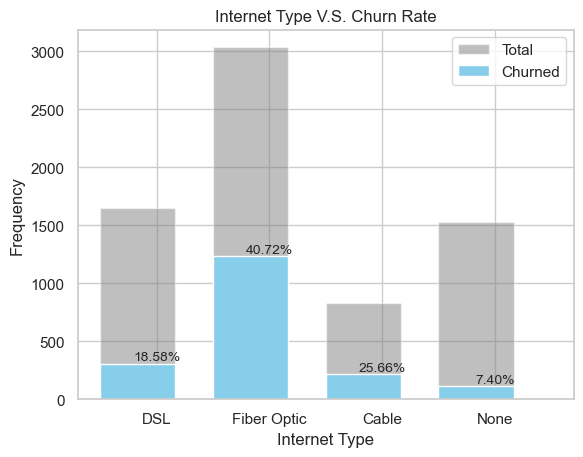

In [36]:
total_charges = df['Internet Type']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=4, alpha=0.5, label='Total', color='gray', width=0.5)
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue',width=0.5)

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Internet Type',fontsize=12)
plt.ylabel('Frequency',fontsize=12)
plt.title('Internet Type V.S. Churn Rate',fontsize=12)
plt.xticks(bin_centers)
plt.legend()
plt.show()

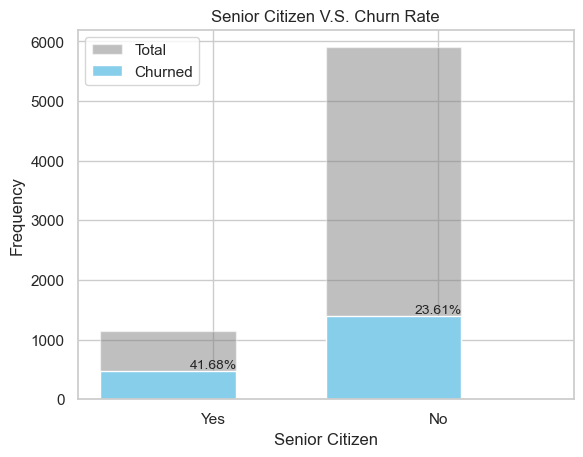

In [37]:
total_charges = df['Senior Citizen']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=2, alpha=0.5, label='Total', color='gray', width=0.3)
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue',width=0.3)

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Senior Citizen',fontsize=12)
plt.ylabel('Frequency',fontsize=12)
plt.title('Senior Citizen V.S. Churn Rate',fontsize=12)
plt.xticks(bin_centers)
plt.legend()
plt.show()

No big churn rate change among different age groups, except 70-80 age group. 
While analyzing our customer demographics, we observed a notable concentration in the age group of 70-80. It's important to consider that, given the natural course of life, there is a possibility that some individuals in this age range may no longer be with us. This information is crucial for a comprehensive understanding of our customer base when building the churn model. 

In [38]:
df['Tenure in Months'].value_counts

<bound method IndexOpsMixin.value_counts of 0        1
1       72
2        1
3       66
4        7
        ..
7038     1
7039    67
7040     9
7041    26
7042    18
Name: Tenure in Months, Length: 7043, dtype: int64>

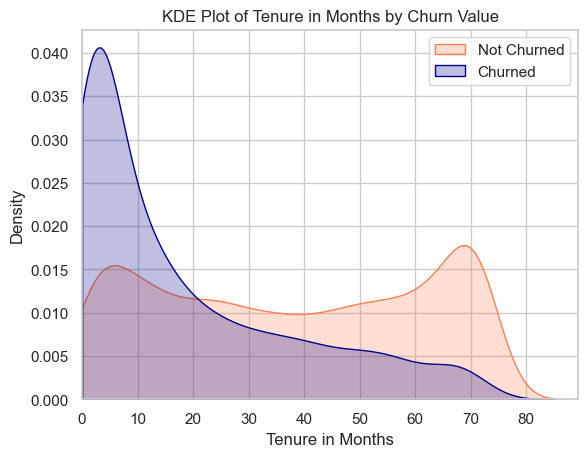

In [39]:
# Relation bewteen Tenure and Churn

sns.kdeplot(df[df['Churn Value'] == 0]['Tenure in Months'], label='Not Churned',color='coral',shade=True,clip=(0, None))
sns.kdeplot(df[df['Churn Value'] == 1]['Tenure in Months'], label='Churned',color='darkblue',shade=True,clip=(0, None))

plt.xlabel('Tenure in Months',fontsize=12)
plt.ylabel('Density',fontsize=12)
plt.title('KDE Plot of Tenure in Months by Churn Value',fontsize=12)
plt.xlim(0, None)

plt.legend()
plt.show()

In [40]:
import plotly.express as px

# Assuming 'df' is your DataFrame
custom_palette = {0: "coral", 1: "skyblue"}
fig = px.histogram(df, x="Tenure in Months", color="Churn Value", marginal="box", color_discrete_map=custom_palette)
fig.show()


The x-axis represents the 'Tenure in Months', which is the duration of time that customers have been subscribed to a service.
Y-Axis (Density):
The y-axis represents the density of occurrences or the likelihood of observing a specific tenure value. The higher the curve, the more likely that tenure values around that point are present in the dataset.
No Churn: The shaded region for Churn Value 0 represents the distribution of tenure values for customers who did not churn.
Churned: The shaded region for Churn Value 1 represents the distribution of tenure values for customers who churned.
Interpretation:
The peaks in each shaded area indicate the most common tenure values for customers with Churn Value 0 and Churn Value 1, respectively.
The spread or width of the curves provides insights into the variability of tenure values for each churn status.
Distinct regions of the curves show where the distributions for churned and non-churned customers differ.

By visually comparing the two curves, we can observe patterns and make inferences about the distribution of tenure values for customers who churned and those who did not.
Churn 1 (churned) curve has a peak at lower tenure values, it suggests that customers with shorter tenure are more likely to churn.
Differences in the spread of the curves may indicate variations in tenure variability for churned and non-churned customers.
This interpretation is based on hypothetical scenarios, and the actual insights will depend on the characteristics of the dataset. Always consider the context of specific data when interpreting visualizations.

In [41]:
df['Payment Method'].value_counts()

Bank Withdrawal    3909
Credit Card        2749
Mailed Check        385
Name: Payment Method, dtype: int64

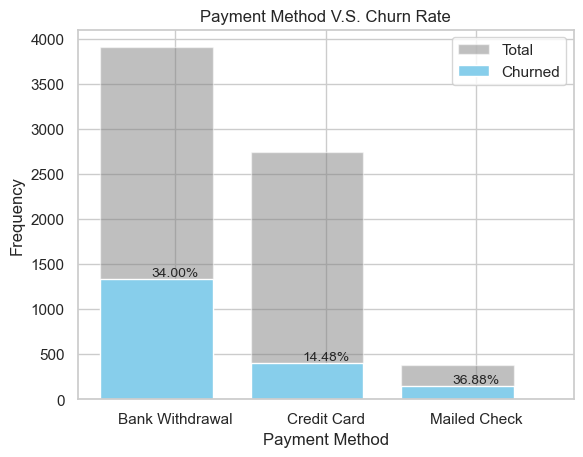

Bank Withdrawal    3909
Credit Card        2749
Mailed Check        385
Name: Payment Method, dtype: int64

In [42]:
total_charges = df['Payment Method']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_charges, bins=3, alpha=0.5, label='Total', color='gray', width=0.5)
hist_churn1, _, _ = plt.hist(x=total_charges[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue',width=0.5)

bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Payment Method')
plt.ylabel('Frequency')
plt.title('Payment Method V.S. Churn Rate')
plt.xticks(bin_centers)
plt.legend()
plt.show()

df['Payment Method'].value_counts()

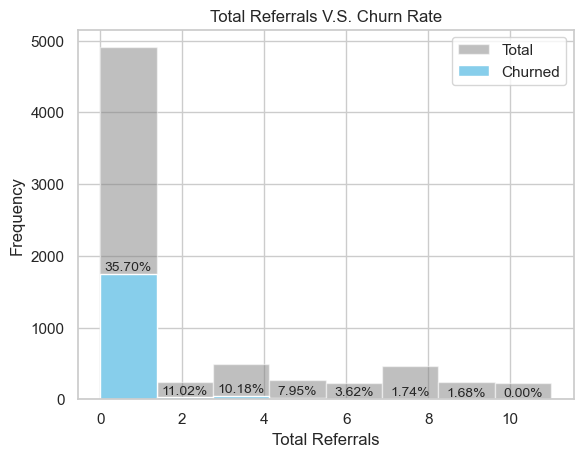

In [43]:
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline


total_referrals = df['Number of Referrals']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_referrals, bins=8, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=total_referrals[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Total Referrals',fontsize=12)
plt.ylabel('Frequency',fontsize=12)
plt.title('Total Referrals V.S. Churn Rate',fontsize=12)
plt.legend()
plt.show()


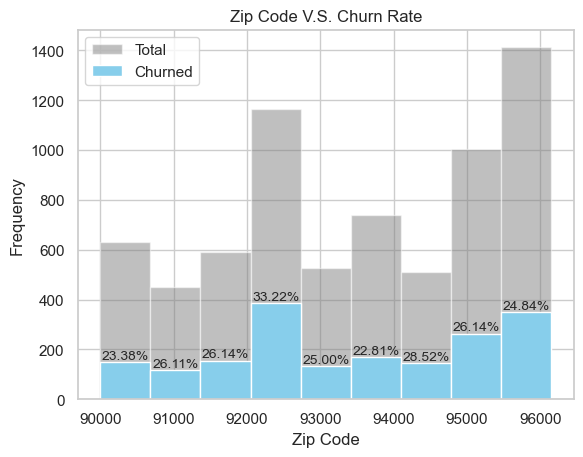

In [44]:

total_referrals = df['Zip Code']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=total_referrals, bins=9, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=total_referrals[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Zip Code', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Zip Code V.S. Churn Rate', fontsize=12)
plt.legend()
plt.show()

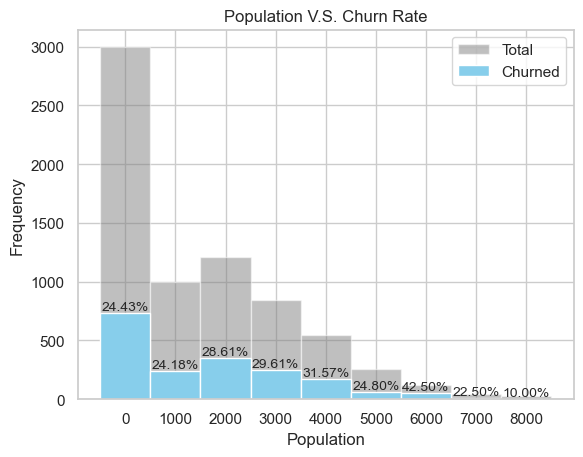

In [45]:
total_referrals = df['Population']
churn_value = df['Churn Value']

custom_bins = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000]

hist_total, bin_edges, _ = plt.hist(x=total_referrals, bins=9, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=total_referrals[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Population', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Population V.S. Churn Rate', fontsize=12)
plt.legend()
plt.xticks(bin_centers, custom_bins[:-1])

plt.show()

In [46]:
df['Monthly Charge'].mean()

64.76169246059918

Text(0, 0.5, 'Total Charges')

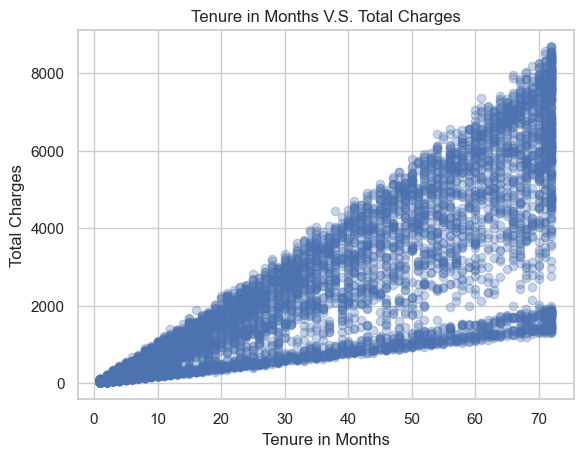

In [47]:
plt.scatter(df['Tenure in Months'], df['Total Charges'], alpha=0.3)
# close to linear relation between 'Tenure in Months' and 'Total Charges'
plt.title('Tenure in Months V.S. Total Charges',fontsize=12)
plt.xlabel('Tenure in Months',fontsize=12)
plt.ylabel('Total Charges',fontsize=12)

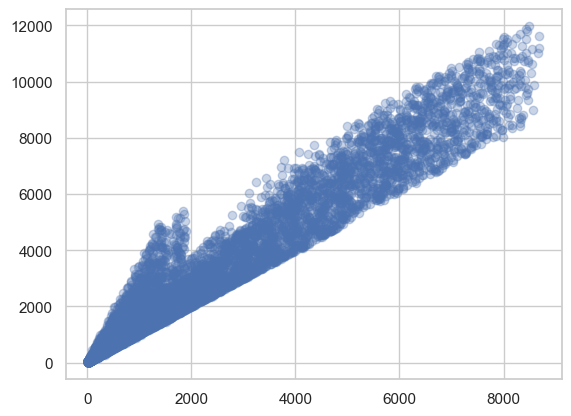

In [48]:
plt.scatter(df['Total Charges'], df['Total Revenue'], alpha=0.3)
# close to linear relation between 'Tenure in Months' and 'Total Charges'

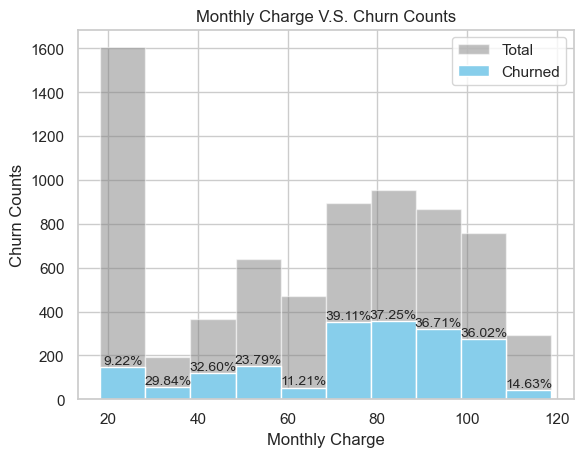

In [93]:
monthly_charge = df['Monthly Charge']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=monthly_charge, bins=10, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=monthly_charge[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Monthly Charge',fontsize=12)
plt.ylabel('Churn Counts',fontsize=12)
plt.title('Monthly Charge V.S. Churn Counts',fontsize=12)
plt.legend()
plt.show()

posx and posy should be finite values
posx and posy should be finite values


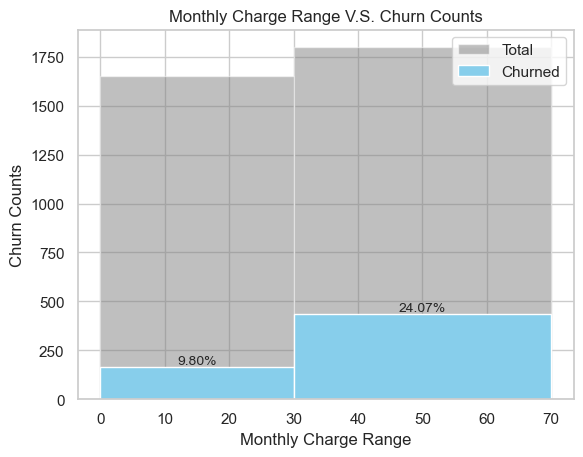

In [134]:
bins = [0, 30, 70, float('inf')]
labels = ['0-30', '31-70', '>70']

df['Monthly Charge Range'] = pd.cut(df['Monthly Charge'], bins=bins, labels=labels, right=False)

monthly_charge = df['Monthly Charge']
churn_value = df['Churn Value']

# Plot the histogram with Monthly Charge ranges
hist_total, bin_edges, _ = plt.hist(x=monthly_charge, bins=bins, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=monthly_charge[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Monthly Charge Range', fontsize=12)
plt.ylabel('Churn Counts', fontsize=12)
plt.title('Monthly Charge Range V.S. Churn Counts', fontsize=12)
plt.legend()
plt.show()

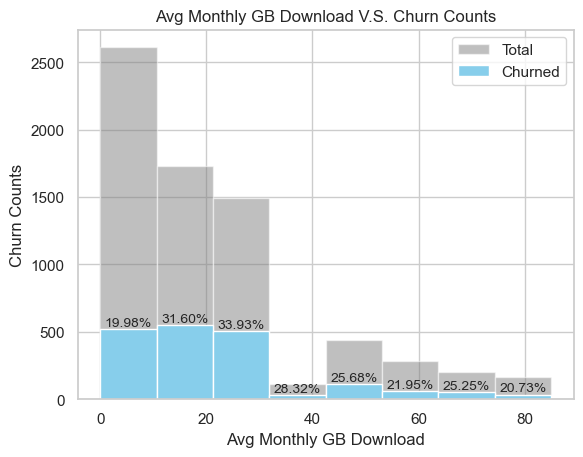

In [50]:
monthly_charge = df['Avg Monthly GB Download']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=monthly_charge, bins=8, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=monthly_charge[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Avg Monthly GB Download', fontsize=12)
plt.ylabel('Churn Counts', fontsize=12)
plt.title('Avg Monthly GB Download V.S. Churn Counts', fontsize=12)
plt.legend()
plt.show()

Text(0.5, 1.0, 'Monthly Charge by Contract and Churn Value')

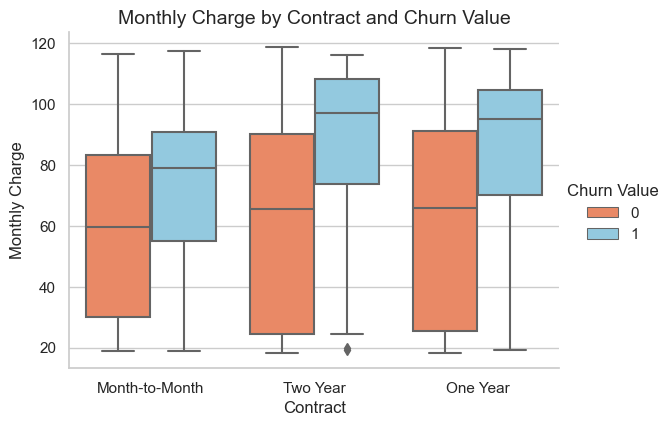

In [51]:
custom_palette = {0: "coral", 1: "skyblue"}

ax = sns.catplot(x="Contract", y="Monthly Charge", hue="Churn Value", kind="box", data=df, height=4.2, aspect=1.4,palette=custom_palette)

ax.set(xlabel='Contract', ylabel='Monthly Charge')
plt.title('Monthly Charge by Contract and Churn Value', fontsize=14)

In [52]:
df.Population.describe()

count      7043.000000
mean      22139.603294
std       21152.392837
min          11.000000
25%        2344.000000
50%       17554.000000
75%       36125.000000
max      105285.000000
Name: Population, dtype: float64

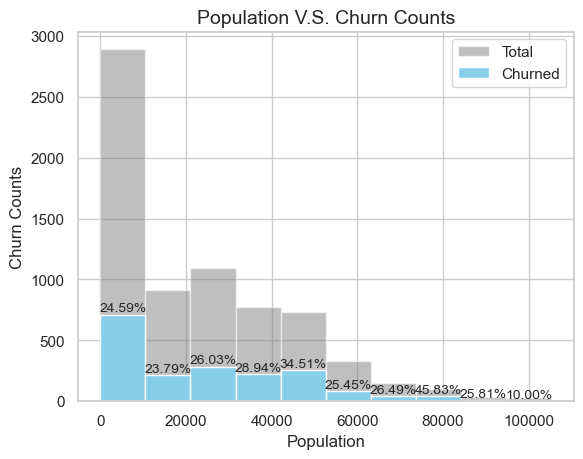

In [53]:
monthly_charge = df['Population']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=monthly_charge, bins=10, alpha=0.5, label='Total', color='grey')
hist_churn1, _, _ = plt.hist(x=monthly_charge[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue')
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Population', fontsize=12)
plt.ylabel('Churn Counts', fontsize=12)
plt.title('Population V.S. Churn Counts', fontsize=14)
plt.legend()
plt.show()

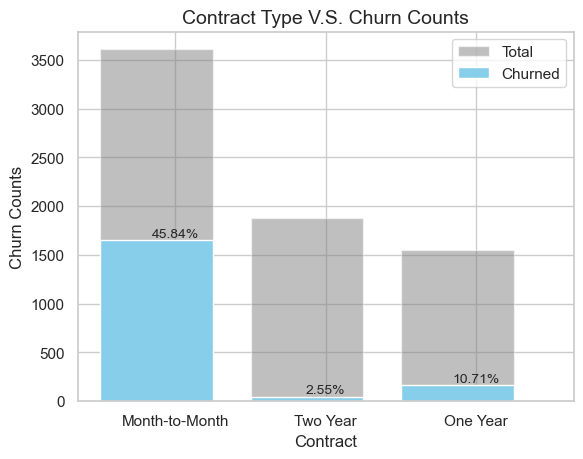

In [54]:
monthly_charge = df['Contract']
churn_value = df['Churn Value']

hist_total, bin_edges, _ = plt.hist(x=monthly_charge, bins=3, alpha=0.5, label='Total', color='grey',width=0.5)
hist_churn1, _, _ = plt.hist(x=monthly_charge[churn_value == 1], bins=bin_edges, alpha=1, label='Churned', color='skyblue',width=0.5)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

ratios = hist_churn1 / hist_total

# Plot the ratios on top of each bin with a smaller font size
for i, ratio in enumerate(ratios):
    plt.text(bin_centers[i], hist_churn1[i], f'{ratio:.2%}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Contract', fontsize=12)
plt.ylabel('Churn Counts', fontsize=12)
plt.title('Contract Type V.S. Churn Counts', fontsize=14)
plt.xticks(bin_centers)
plt.legend()
plt.show()

In [55]:
df['Contract'].value_counts()

Month-to-Month    3610
Two Year          1883
One Year          1550
Name: Contract, dtype: int64

In [56]:
import plotly.express as px

custom_palette = {'Month-to-Month': "#FF7F50",  # Coral
                  'Two Year': "skyblue",        
                  'One Year': "#8FBC8F"}        # Dark Sea Green

fig = px.pie(df.groupby(['Contract', 'Churn Value'])['Customer ID'].count().reset_index(),
             values='Customer ID',
             names='Contract',
             facet_col='Churn Value',
             title='Churn rate by contract type',
             color='Contract',  # Use 'Contract' for color mapping
             color_discrete_map=custom_palette)

fig.show()


Text(0.5, 1.0, 'Monthly Charge by Contract and Churn Value')

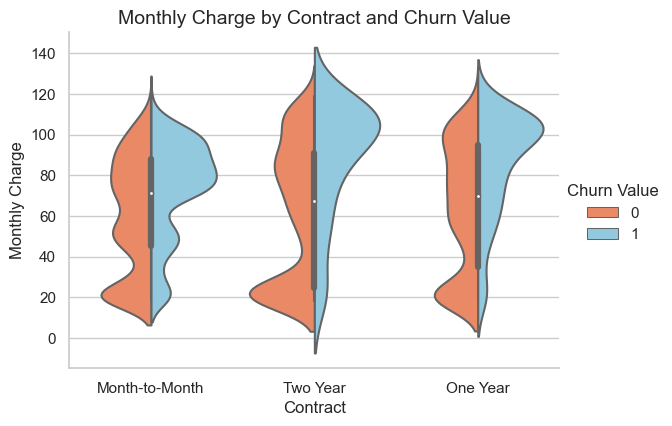

In [57]:
custom_palette = {0: "coral", 1: "skyblue"}

ax = sns.catplot(x="Contract", y="Monthly Charge", hue="Churn Value", kind="violin",
                 split=True, palette=custom_palette, data=df, height=4.2, aspect=1.4, )

ax.set(xlabel='Contract', ylabel='Monthly Charge')
plt.title('Monthly Charge by Contract and Churn Value', fontsize=14)

Text(0.5, 1.0, 'Monthly Charge by Phone Service and Churn Value')

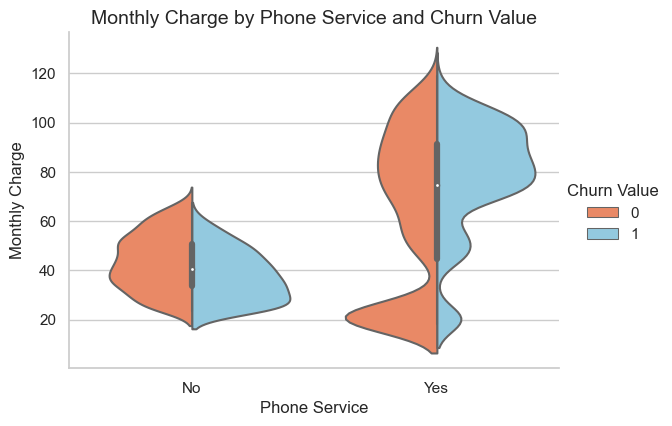

In [58]:
custom_palette = {0: "coral", 1: "skyblue"}

ax = sns.catplot(x="Phone Service", y="Monthly Charge", hue="Churn Value", kind="violin",
                 split=True, palette=custom_palette, data=df, height=4.2, aspect=1.4, )

ax.set(xlabel='Phone Service', ylabel='Monthly Charge')
plt.title('Monthly Charge by Phone Service and Churn Value', fontsize=14)

In [59]:
import numpy as np

churn_pm = df.assign(churn_clients = np.where(df['Churn Value']== 1,df['Customer ID'],None))\
   .groupby(['Contract','Age Group']).agg({'churn_clients':'count'}).reset_index()
pm_clients = df.groupby(['Contract','Age Group'])['Customer ID'].count().reset_index()
pm_data = pm_clients.join(churn_pm.set_index(['Contract','Age Group']), on=['Contract','Age Group'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients']/pm_data['Customer ID']) * 100),2)
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Contract',
             facet_col = 'Age Group',
             color = 'churn_rate,%',
             text = 'churn_rate,%',
             color_continuous_scale='Blues')

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Contract Type', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()

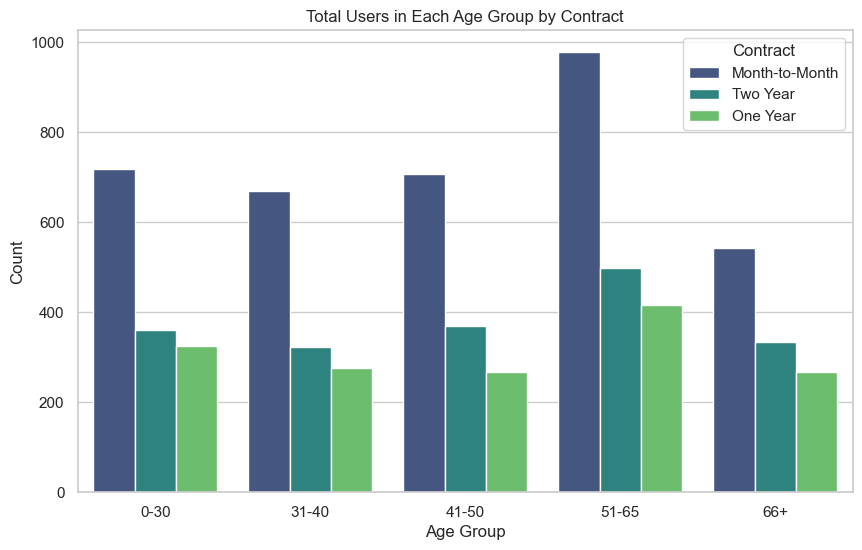

In [60]:
# Create a bar plot
plt.figure(figsize=(10, 6))
sns.countplot(x='Age Group', hue='Contract', data=df, palette='viridis')
plt.title('Total Users in Each Age Group by Contract')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

In [61]:
df_price = df[['Tenure in Months','Avg Monthly Long Distance Charges','Monthly Charge','Total Charges','Total Refunds',
                        'Total Extra Data Charges','Total Long Distance Charges','Total Revenue','Avg Monthly GB Download']]

[Text(0.5, 0, 'Tenure in Months'),
 Text(1.5, 0, 'Avg Monthly Long Distance Charges'),
 Text(2.5, 0, 'Monthly Charge'),
 Text(3.5, 0, 'Total Charges'),
 Text(4.5, 0, 'Total Refunds'),
 Text(5.5, 0, 'Total Extra Data Charges'),
 Text(6.5, 0, 'Total Long Distance Charges'),
 Text(7.5, 0, 'Total Revenue'),
 Text(8.5, 0, 'Avg Monthly GB Download')]

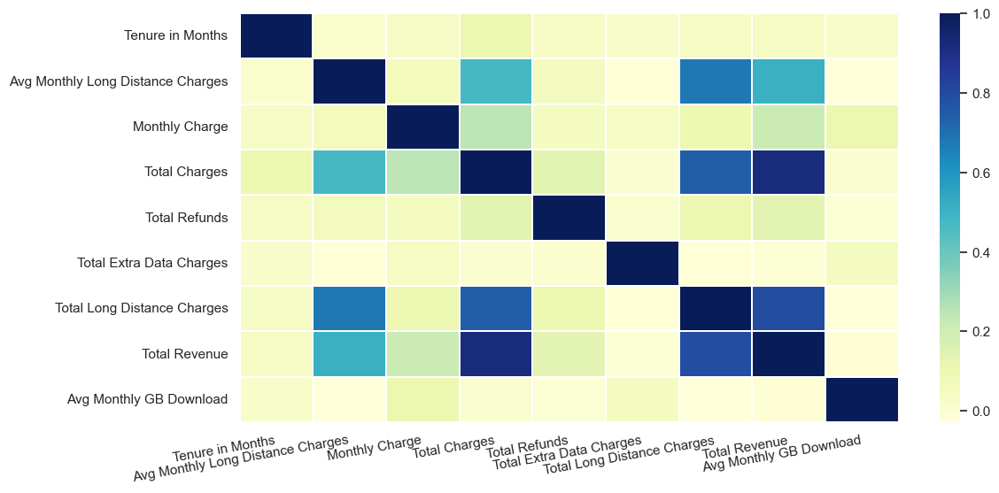

In [62]:
plt.figure(figsize=(12, 6))

#pastel_cmap = sns.color_palette("pastel")
corr = df_price.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu")              # cmap="YlGnBu"   yellow blue green color set.

tick_positions = [i + 0.5 for i in range(len(corr.columns))]
ax.set_xticks(tick_positions)
ax.set_xticklabels(corr.columns, rotation=10, ha='right')

In [63]:
price_corr = df_price.corr(method = 'pearson')

In [64]:
price_corr 

,Tenure in Months,Avg Monthly Long Distance Charges,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Avg Monthly GB Download
Tenure in Months,1.000000,0.014596,0.247582,0.826074,0.059021,0.082266,0.674149,0.853146,0.049119
Avg Monthly Long Distance Charges,0.014596,1.000000,0.138396,0.069500,-0.018644,0.002414,0.599828,0.232291,-0.030455
Monthly Charge,0.247582,0.138396,1.000000,0.651236,0.033482,0.126244,0.246300,0.588887,0.391787
Total Charges,0.826074,0.069500,0.651236,1.000000,0.039558,0.121859,0.610185,0.972212,0.223268
Total Refunds,0.059021,-0.018644,0.033482,0.039558,1.000000,0.016755,0.028113,0.036984,0.002397
Total Extra Data Charges,0.082266,0.002414,0.126244,0.121859,0.016755,1.000000,0.058871,0.122496,0.088939
Total Long Distance Charges,0.674149,0.599828,0.246300,0.610185,0.028113,0.058871,1.000000,0.778559,0.011373
Total Revenue,0.853146,0.232291,0.588887,0.972212,0.036984,0.122496,0.778559,1.000000,0.180726
Avg Monthly GB Download,0.049119,-0.030455,0.391787,0.223268,0.002397,0.088939,0.011373,0.180726,1.000000


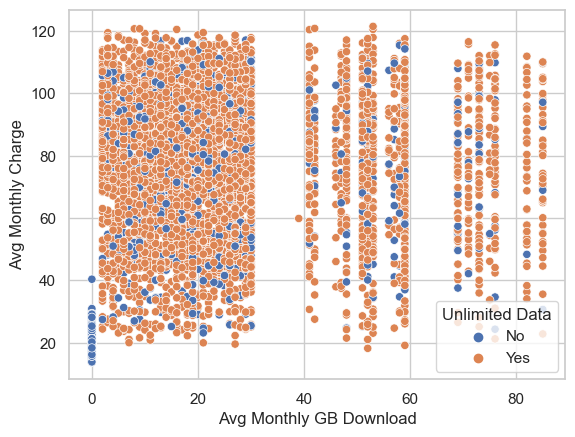

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

df['Avg Monthly Charge'] = df['Total Charges']/df['Tenure in Months']
sns.scatterplot(x='Avg Monthly GB Download', y='Avg Monthly Charge', hue='Unlimited Data', data=df)
plt.show()


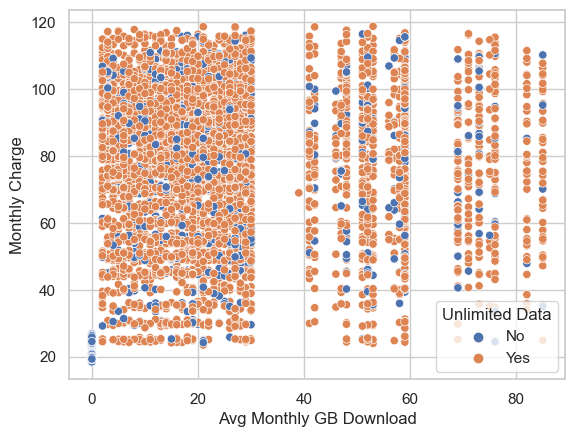

In [87]:
sns.scatterplot(x='Avg Monthly GB Download', y='Monthly Charge', hue='Unlimited Data', data=df)
plt.show()

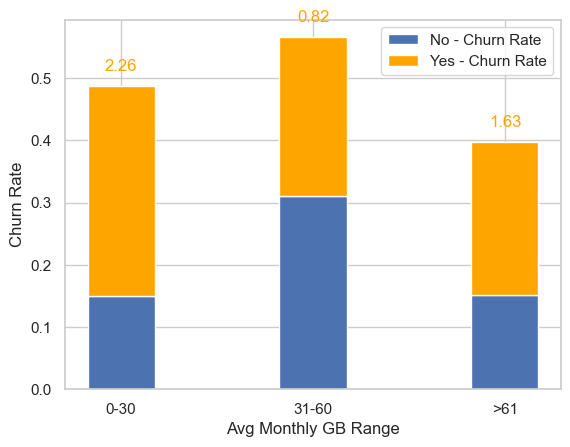

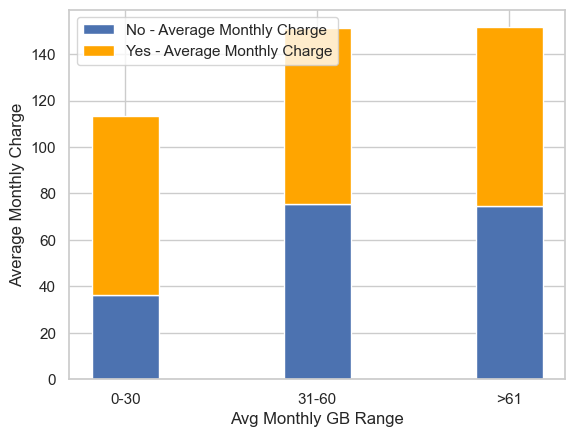

In [92]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your dataframe is named 'df'
# Create 'Avg Monthly GB Download' ranges
bins = [0, 30, 60, float('inf')]
labels = ['0-30', '31-60', '>61']

df['Avg Monthly GB Range'] = pd.cut(df['Avg Monthly GB Download'], bins=bins, labels=labels, right=False)

# Group by 'Avg Monthly GB Range' and 'Unlimited Data', calculate churn rate and additional metrics
grouped_df = df.groupby(['Avg Monthly GB Range', 'Unlimited Data']).agg({
    'Churn Value': 'mean',
    'Monthly Charge': 'mean'
}).unstack()

# Calculate Churn Rate Ratio
grouped_df['Churn Rate Ratio'] = grouped_df['Churn Value']['Yes'] / grouped_df['Churn Value']['No']

# Plot the churn rates, churn rate ratio, and average monthly charge
fig, ax1 = plt.subplots()

bar_width = 0.35
index = range(len(grouped_df.index))

# Plot Churn Rates
ax1.bar(index, grouped_df['Churn Value']['No'], width=bar_width, label='No - Churn Rate', color='b', align='center')
ax1.bar(index, grouped_df['Churn Value']['Yes'], width=bar_width, bottom=grouped_df['Churn Value']['No'], label='Yes - Churn Rate', color='orange', align='center')

ax1.set_xlabel('Avg Monthly GB Range')
ax1.set_ylabel('Churn Rate')
ax1.set_xticks(index)
ax1.set_xticklabels(grouped_df.index)
ax1.legend()

# Display Churn Rate Ratio on top of each bin
for i, value in enumerate(grouped_df['Churn Rate Ratio']):
    ax1.text(i, grouped_df['Churn Value']['No'][i] + grouped_df['Churn Value']['Yes'][i] + 0.02, f'{value:.2f}', ha='center', va='bottom', color='orange')

# Plot average monthly charge separately
fig, ax2 = plt.subplots()
ax2.bar(index, grouped_df['Monthly Charge']['No'], width=bar_width, label='No - Average Monthly Charge', color='b', align='center')
ax2.bar(index, grouped_df['Monthly Charge']['Yes'], width=bar_width, bottom=grouped_df['Monthly Charge']['No'], label='Yes - Average Monthly Charge', color='orange', align='center')

ax2.set_xlabel('Avg Monthly GB Range')
ax2.set_ylabel('Average Monthly Charge')
ax2.set_xticks(index)
ax2.set_xticklabels(grouped_df.index)
ax2.legend()

plt.show()


In [165]:
import numpy as np

churn_pm = df.assign(churn_clients = np.where(df['Churn Value']== 1,df['Customer ID'],None))\
   .groupby(['Contract','Avg Monthly GB Range']).agg({'churn_clients':'count'}).reset_index()
pm_clients = df.groupby(['Contract','Avg Monthly GB Range'])['Customer ID'].count().reset_index()
pm_data = pm_clients.join(churn_pm.set_index(['Contract','Avg Monthly GB Range']), on=['Contract','Avg Monthly GB Range'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients']/pm_data['Customer ID']) * 100),2)
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Contract',
             facet_col = 'Avg Monthly GB Range',
             color = 'churn_rate,%',
             text = 'churn_rate,%',
             color_continuous_scale='Blues')

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Contract', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()

In [166]:
import numpy as np
import plotly.express as px

# Assuming your dataframe is named 'df'

# Separate data for Unlimited Data Yes
df_unlimited_yes = df[df['Unlimited Data'] == 'Yes']

churn_pm_yes = df_unlimited_yes.assign(churn_clients=np.where(df_unlimited_yes['Churn Value'] == 1, df_unlimited_yes['Customer ID'], None)) \
    .groupby(['Contract', 'Avg Monthly GB Range']).agg({'churn_clients': 'count'}).reset_index()
pm_clients_yes = df_unlimited_yes.groupby(['Contract', 'Avg Monthly GB Range'])['Customer ID'].count().reset_index()
pm_data_yes = pm_clients_yes.join(churn_pm_yes.set_index(['Contract', 'Avg Monthly GB Range']),
                                  on=['Contract', 'Avg Monthly GB Range'])

pm_data_yes['churn_rate,%'] = round(((pm_data_yes['churn_clients'] / pm_data_yes['Customer ID']) * 100), 2)

# Create chart for Unlimited Data Yes
fig_yes = px.bar(pm_data_yes.sort_values('churn_rate,%'),
                 x='churn_rate,%',
                 y='Contract',
                 facet_col='Avg Monthly GB Range',
                 color='churn_rate,%',
                 text='churn_rate,%',
                 color_continuous_scale='Blues',
                 title='Churn Rate for Unlimited Data - Yes')

fig_yes.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig_yes.update_yaxes(title_text='Contract', tickfont=dict(size=12))

fig_yes.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig_yes.show()

# Separate data for Unlimited Data No
df_unlimited_no = df[df['Unlimited Data'] == 'No']

churn_pm_no = df_unlimited_no.assign(churn_clients=np.where(df_unlimited_no['Churn Value'] == 1, df_unlimited_no['Customer ID'], None)) \
    .groupby(['Contract', 'Avg Monthly GB Range']).agg({'churn_clients': 'count'}).reset_index()
pm_clients_no = df_unlimited_no.groupby(['Contract', 'Avg Monthly GB Range'])['Customer ID'].count().reset_index()
pm_data_no = pm_clients_no.join(churn_pm_no.set_index(['Contract', 'Avg Monthly GB Range']),
                                on=['Contract', 'Avg Monthly GB Range'])

pm_data_no['churn_rate,%'] = round(((pm_data_no['churn_clients'] / pm_data_no['Customer ID']) * 100), 2)

# Create chart for Unlimited Data No
fig_no = px.bar(pm_data_no.sort_values('churn_rate,%'),
                x='churn_rate,%',
                y='Contract',
                facet_col='Avg Monthly GB Range',
                color='churn_rate,%',
                text='churn_rate,%',
                color_continuous_scale='Blues',
                title='Churn Rate for Unlimited Data - No')

fig_no.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig_no.update_yaxes(title_text='Contract', tickfont=dict(size=12))

fig_no.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig_no.show()


In [164]:
import numpy as np
import plotly.express as px

# Assuming your dataframe is named 'df'

# Separate data for Unlimited Data Yes
df_unlimited_yes = df[df['Unlimited Data'] == 'Yes']

churn_pm_yes = df_unlimited_yes.assign(churn_clients=np.where(df_unlimited_yes['Churn Value'] == 1, df_unlimited_yes['Customer ID'], None)) \
    .groupby(['Monthly Charge Range', 'Avg Monthly GB Range']).agg({'churn_clients': 'count'}).reset_index()
pm_clients_yes = df_unlimited_yes.groupby(['Monthly Charge Range', 'Avg Monthly GB Range'])['Customer ID'].count().reset_index()
pm_data_yes = pm_clients_yes.join(churn_pm_yes.set_index(['Monthly Charge Range', 'Avg Monthly GB Range']),
                                  on=['Monthly Charge Range', 'Avg Monthly GB Range'])

pm_data_yes['churn_rate,%'] = round(((pm_data_yes['churn_clients'] / pm_data_yes['Customer ID']) * 100), 2)

# Create chart for Unlimited Data Yes
fig_yes = px.bar(pm_data_yes.sort_values('churn_rate,%'),
                 x='churn_rate,%',
                 y='Monthly Charge Range',
                 facet_col='Avg Monthly GB Range',
                 color='churn_rate,%',
                 text='churn_rate,%',
                 color_continuous_scale='Blues',
                 title='Churn Rate for Unlimited Data - Yes')

fig_yes.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig_yes.update_yaxes(title_text='Monthly Charge Range', tickfont=dict(size=12))

fig_yes.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig_yes.show()

# Separate data for Unlimited Data No
df_unlimited_no = df[df['Unlimited Data'] == 'No']

churn_pm_no = df_unlimited_no.assign(churn_clients=np.where(df_unlimited_no['Churn Value'] == 1, df_unlimited_no['Customer ID'], None)) \
    .groupby(['Monthly Charge Range', 'Avg Monthly GB Range']).agg({'churn_clients': 'count'}).reset_index()
pm_clients_no = df_unlimited_no.groupby(['Monthly Charge Range', 'Avg Monthly GB Range'])['Customer ID'].count().reset_index()
pm_data_no = pm_clients_no.join(churn_pm_no.set_index(['Monthly Charge Range', 'Avg Monthly GB Range']),
                                on=['Monthly Charge Range', 'Avg Monthly GB Range'])

pm_data_no['churn_rate,%'] = round(((pm_data_no['churn_clients'] / pm_data_no['Customer ID']) * 100), 2)

# Create chart for Unlimited Data No
fig_no = px.bar(pm_data_no.sort_values('churn_rate,%'),
                x='churn_rate,%',
                y='Monthly Charge Range',
                facet_col='Avg Monthly GB Range',
                color='churn_rate,%',
                text='churn_rate,%',
                color_continuous_scale='Blues',
                title='Churn Rate for Unlimited Data - No')

fig_no.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig_no.update_yaxes(title_text='Monthly Charge Range', tickfont=dict(size=12))

fig_no.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig_no.show()


In [66]:
import scipy.stats

df_temp = df_price.corr()

correlation_matrix = df_temp
p_value_matrix = df_temp.corr(method=lambda x, y: scipy.stats.pearsonr(x, y)[1])

# Display correlation coefficients and p-values
for col1 in df_temp.columns:
    for col2 in df_temp.columns:
        correlation_coefficient = correlation_matrix.at[col1, col2]
        p_value = p_value_matrix.at[col1, col2]
        print(f'Correlation between {col1} and {col2}: {correlation_coefficient:.4f}, p-value: {p_value:.4f}')

Correlation between Tenure in Months and Tenure in Months: 1.0000, p-value: 1.0000
Correlation between Tenure in Months and Avg Monthly Long Distance Charges: 0.0146, p-value: 0.7750
Correlation between Tenure in Months and Monthly Charge: 0.2476, p-value: 0.4620
Correlation between Tenure in Months and Total Charges: 0.8261, p-value: 0.0006
Correlation between Tenure in Months and Total Refunds: 0.0590, p-value: 0.4684
Correlation between Tenure in Months and Total Extra Data Charges: 0.0823, p-value: 0.5414
Correlation between Tenure in Months and Total Long Distance Charges: 0.6741, p-value: 0.0194
Correlation between Tenure in Months and Total Revenue: 0.8531, p-value: 0.0002
Correlation between Tenure in Months and Avg Monthly GB Download: 0.0491, p-value: 0.5195
Correlation between Avg Monthly Long Distance Charges and Tenure in Months: 0.0146, p-value: 0.7750
Correlation between Avg Monthly Long Distance Charges and Avg Monthly Long Distance Charges: 1.0000, p-value: 1.0000
Corr

Linear relationships among features can lead to multicollinearity, which can affect the stability and interpretability of regression models. It's essential to check for multicollinearity, especially if using linear models like linear regression.

0.00 - 0.19: very weak
0.20 - 0.39: weak
0.40 - 0.59: moderate
0.60 - 0.79: strong
0.80 - 1.00: very strong

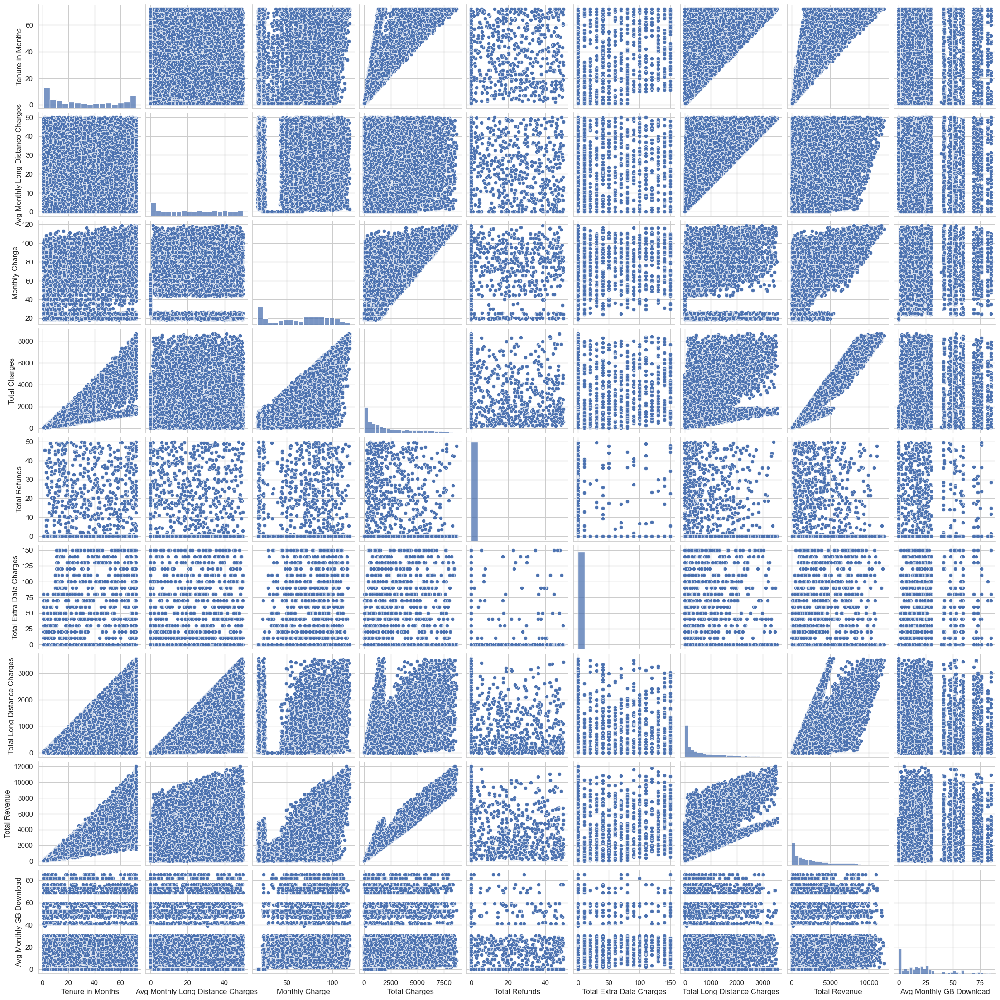

In [67]:
sns.pairplot(df_price)

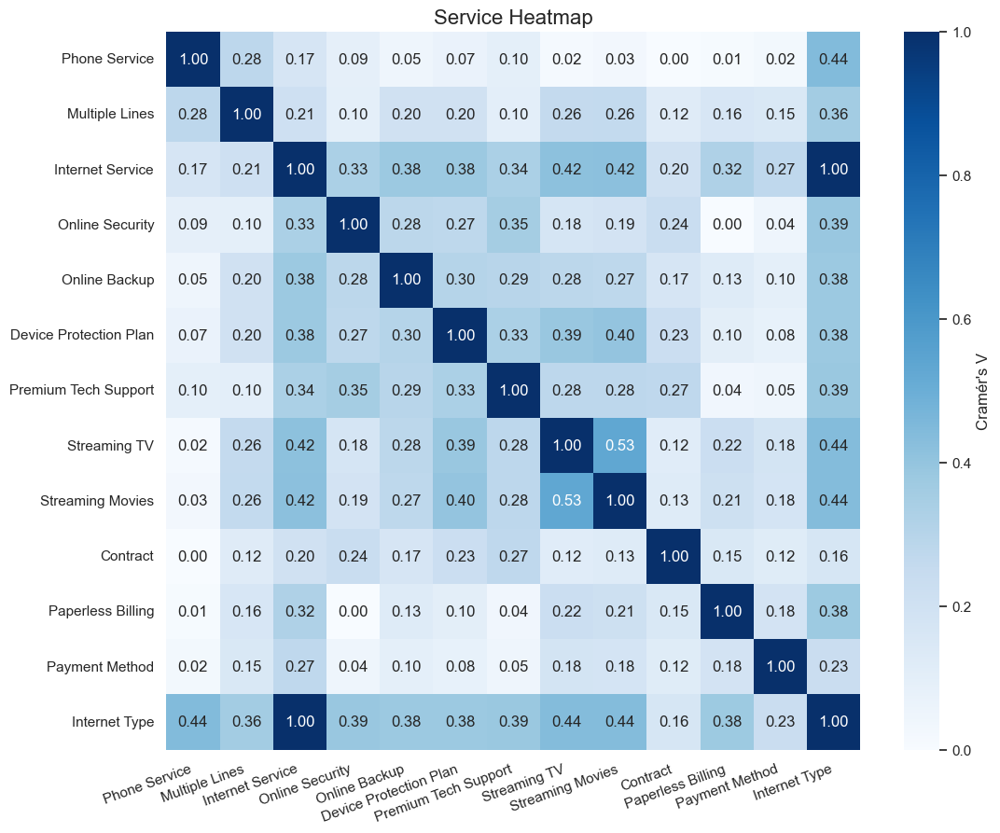

In [104]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2_corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    r_corr = r - ((r-1)**2)/(n-1)
    k_corr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))

service_columns = [
    'Phone Service', 'Multiple Lines',
    'Internet Service', 'Online Security', 'Online Backup', 'Device Protection Plan',
    'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method','Internet Type'
]


df_service = pd.DataFrame(index=service_columns, columns=service_columns)


for col1 in df_service.columns:
    for col2 in df_service.columns:
        if col1 == col2:
           
            df_service.loc[col1, col2] = 1.0
        else:
            df_service.loc[col1, col2] = cramers_v(df[col1], df[col2])

df_service = df_service.astype(float)

plt.figure(figsize=(12, 10))
sns.heatmap(df_service, annot=True, fmt=".2f", cmap='Blues', cbar_kws={'label': "Cramér's V"})
#ax.set_xticks(tick_positions)
#ax.set_xticklabels(service_columns, rotation=10, ha='right')
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
# Rotate x-tick labels at an angle
plt.xticks(rotation=20, ha='right')
plt.title("Service Heatmap",fontsize=16)
plt.show()


In [100]:

churn_pm = df.assign(churn_clients = np.where(df['Churn Value']== 1,df['Customer ID'],None))\
   .groupby(['Monthly Charge Range','Internet Type']).agg({'churn_clients':'count'}).reset_index()
pm_clients = df.groupby(['Monthly Charge Range','Internet Type'])['Customer ID'].count().reset_index()
pm_data = pm_clients.join(churn_pm.set_index(['Monthly Charge Range','Internet Type']), on=['Monthly Charge Range','Internet Type'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients']/pm_data['Customer ID']) * 100),2)
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Monthly Charge Range',
             facet_col = 'Internet Type',
             color = 'churn_rate,%',
             text = 'churn_rate,%',
             color_continuous_scale='Blues')

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Monthly Charge Range', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()

In [137]:
churn_pm = df.assign(churn_clients = np.where(df['Churn Value']== 1,df['Customer ID'],None))\
   .groupby(['Contract','Internet Type']).agg({'churn_clients':'count'}).reset_index()
pm_clients = df.groupby(['Contract','Internet Type'])['Customer ID'].count().reset_index()
pm_data = pm_clients.join(churn_pm.set_index(['Contract','Internet Type']), on=['Contract','Internet Type'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients']/pm_data['Customer ID']) * 100),2)
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Contract',
             facet_col = 'Internet Type',
             color = 'churn_rate,%',
             text = 'churn_rate,%',
             color_continuous_scale='Blues',
             facet_col_spacing=0.1)  # Adjust the spacing between facet columns
            # height=400,  # Adjust the height of each facet column
             #width=800)

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Contract', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()

In [113]:
import numpy as np
import plotly.express as px

# Assuming your dataframe is named 'df'

# Create a new feature 'Streaming' based on Streaming TV or Streaming Movies
df['Streaming'] = np.where((df['Streaming TV'] == 'Yes') | (df['Streaming Movies'] == 'Yes'), 'Yes', 'No')

# Calculate churn rate
churn_pm = df.assign(churn_clients=np.where(df['Churn Value'] == 1, df['Customer ID'], None)) \
    .groupby(['Streaming', 'Internet Type']).agg({'churn_clients': 'count'}).reset_index()

pm_clients = df.groupby(['Streaming', 'Internet Type'])['Customer ID'].count().reset_index()

pm_data = pm_clients.join(churn_pm.set_index(['Streaming', 'Internet Type']),
                          on=['Streaming', 'Internet Type'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients'] / pm_data['Customer ID']) * 100), 2)

# Define category orders for 'Streaming' feature
category_orders = {'Streaming': ['Yes', 'No']}

# Create bar chart
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Streaming',
             facet_col='Internet Type',
             color='churn_rate,%',
             text='churn_rate,%',
             color_continuous_scale='Blues',
             category_orders=category_orders)

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Streaming', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()


In [123]:
import numpy as np
import plotly.express as px

# Assuming your dataframe is named 'df'

# Create a new feature combining 'Streaming TV' and 'Streaming Movies'
df['Streaming'] = df['Streaming TV'] +'TV' ' + ' + df['Streaming Movies']+'Movies'

# Calculate churn rate
churn_pm = df.assign(churn_clients=np.where(df['Churn Value'] == 1, df['Customer ID'], None)) \
    .groupby(['Streaming', 'Internet Type']).agg({'churn_clients': 'count'}).reset_index()

pm_clients = df.groupby(['Streaming', 'Internet Type'])['Customer ID'].count().reset_index()

pm_data = pm_clients.join(churn_pm.set_index(['Streaming', 'Internet Type']),
                          on=['Streaming', 'Internet Type'])

pm_data['churn_rate,%'] = round(((pm_data['churn_clients'] / pm_data['Customer ID']) * 100), 2)

# Create bar chart
fig = px.bar(pm_data.sort_values('churn_rate,%'),
             x='churn_rate,%',
             y='Streaming',
             facet_col='Internet Type',
             color='churn_rate,%',
             text='churn_rate,%',
             color_continuous_scale='Blues')

fig.update_xaxes(title_text='Churn Rate(%)', tickfont=dict(size=12))
fig.update_yaxes(title_text='Streaming', tickfont=dict(size=12))

fig.update_layout(
    plot_bgcolor='lightgray',  # Background color of the plot
    paper_bgcolor='lightgray'  # Background color of the paper (area outside the plot)
)
fig.show()


In [102]:
df[df['Internet Type']=='Cable']['Churn Value'].value_counts()

0    617
1    213
Name: Churn Value, dtype: int64

# Feature Engineering

## Remove data

Remove Gender as no difference shown in different gender group

Remove Referred a Friend as Number of Referrals has included it.

Remove ID (1626 unique values, no connections found)

Remove Customer Satisfaction score (great metric and tightly related to churn rate, but not a realistic accurate data we can get from business operation, could be calculated from churn data)

CLTV (no input how they are calculated)

In [69]:
churn_columns_to_drop1 = ['Customer Status','Churn Label','Churn Score','CLTV','Churn Category','Churn Reason','Satisfaction Score','Zip Code','Population']
data = df.copy()
data=data.drop(churn_columns_to_drop1, axis=1) 

In [70]:
columns_to_drop2 = ['Customer ID','Age','Gender','Under 30','Senior Citizen', 'Dependents','Country','State','City','Latitude','Longitude','address','ID','Quarter','Referred a Friend','Total Revenue','Internet Service']
data = data.drop(columns=columns_to_drop2, axis=1)

## Create New Feature

Create new features

Charge difference = Total Charge - Tenure* Monthly Charge
Diff from User Average= Monthly charge - Customer Average Monthly

Age Group （<30, 31 – 40, 41 – 50, 51 – 65,  66+）
     Remove ‘Under 30’ & ‘Senior’, Categorize ‘Age’ to ‘Age Group’

In [71]:
data['Charge difference'] = data['Total Charges'] - data['Monthly Charge']*data['Tenure in Months']

In [72]:
data['Age Group'].value_counts()

#age_labels = ['0-30', '31-40', '41-50', '51-65', '66+']
#df['Age Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

51-65    1892
0-30     1401
41-50    1342
31-40    1266
66+      1142
Name: Age Group, dtype: int64

In [73]:
term_mapping = {'Month-to-Month': 2, 'One Year': 1, 'Two Year': 0}
data['Contract'] = data['Contract'].map(term_mapping)
data['Contract'].value_counts()

2    3610
0    1883
1    1550
Name: Contract, dtype: int64

# Modelling

## Feature Preprocessor

In [74]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FeaturePreprocessor(BaseEstimator, TransformerMixin):
    def __init__(self, numerical_features, onehot_categorical_features, label_encoded_features):
        self.numerical_features = numerical_features
        self.onehot_categorical_features = onehot_categorical_features
        self.label_encoded_features = label_encoded_features
        self.feature_preprocessor = self._create_feature_preprocessor()

    def fit(self, X, y=None):
        self.feature_preprocessor.fit(X)
        return self

    def transform(self, X):
        # Extract 'Churn Value' column
        churn_value = X['Churn Value'].reset_index(drop=True)
        
        # Transform the remaining features
        transformed_data = self.feature_preprocessor.transform(X.drop(columns=['Churn Value']))
        
        # Combine 'Churn Value' with the transformed features
        columns = self.feature_preprocessor.get_feature_names_out()
        transformed_df = pd.DataFrame(transformed_data, columns=columns)
        return pd.concat([churn_value, transformed_df], axis=1)

    def _create_feature_preprocessor(self):
        # Separate transformers for numerical features
        numerical_transformer = MinMaxScaler()

        # Separate transformers for one-hot encoded and label encoded categorical features
        onehot_categorical_transformer = OneHotEncoder(handle_unknown='ignore')
        label_encoded_transformer = ColumnTransformer(
            transformers=[('label_encoded', OrdinalEncoder(), self.label_encoded_features)],
            remainder='passthrough'
        )

        # Combine transformers using ColumnTransformer
        preprocessor = ColumnTransformer(
            transformers=[
                ('num', numerical_transformer, self.numerical_features),
                ('onehot_cat', onehot_categorical_transformer, self.onehot_categorical_features),
                ('label_encoded_cat', label_encoded_transformer, self.label_encoded_features)
            ]
        )

        # Create a pipeline with the ColumnTransformer
        feature_preprocessor = Pipeline(steps=[
            ('preprocessor', preprocessor)
        ])
        
        return feature_preprocessor


#numerical_features = ['Tenure in Months','Avg Monthly Long Distance Charges','Avg Monthly GB Download','Monthly Charge',
#                       'Total Charges','Total Refunds','Total Extra Data Charges','Total Long Distance Charges',
 #                    'Charge difference']
    
numerical_features = ['Tenure in Months','Avg Monthly Long Distance Charges','Avg Monthly GB Download','Monthly Charge',
                       'Total Refunds','Total Extra Data Charges','Total Long Distance Charges',
                     'Charge difference','Contract']

onehot_categorical_features = ['Age Group', 'Offer','Internet Type','Payment Method']

label_encoded_features =['Married','Number of Dependents','Number of Referrals','Phone Service','Multiple Lines',
                         'Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                         'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Paperless Billing']

preprocessor = FeaturePreprocessor(numerical_features, onehot_categorical_features, label_encoded_features)
data_processed = preprocessor.fit_transform(data)
data_processed.head()


,Churn Value,num__Tenure in Months,num__Avg Monthly Long Distance Charges,num__Avg Monthly GB Download,num__Monthly Charge,num__Total Refunds,num__Total Extra Data Charges,num__Total Long Distance Charges,num__Charge difference,num__Contract,onehot_cat__Age Group_0-30,onehot_cat__Age Group_31-40,onehot_cat__Age Group_41-50,onehot_cat__Age Group_51-65,onehot_cat__Age Group_66+,onehot_cat__Offer_None,onehot_cat__Offer_Offer A,onehot_cat__Offer_Offer B,onehot_cat__Offer_Offer C,onehot_cat__Offer_Offer D,onehot_cat__Offer_Offer E,onehot_cat__Internet Type_Cable,onehot_cat__Internet Type_DSL,onehot_cat__Internet Type_Fiber Optic,onehot_cat__Internet Type_None,onehot_cat__Payment Method_Bank Withdrawal,onehot_cat__Payment Method_Credit Card,onehot_cat__Payment Method_Mailed Check,label_encoded_cat__label_encoded__Married,label_encoded_cat__label_encoded__Number of Dependents,label_encoded_cat__label_encoded__Number of Referrals,label_encoded_cat__label_encoded__Phone Service,label_encoded_cat__label_encoded__Multiple Lines,label_encoded_cat__label_encoded__Online Security,label_encoded_cat__label_encoded__Online Backup,label_encoded_cat__label_encoded__Device Protection Plan,label_encoded_cat__label_encoded__Premium Tech Support,label_encoded_cat__label_encoded__Streaming TV,label_encoded_cat__label_encoded__Streaming Movies,label_encoded_cat__label_encoded__Streaming Music,label_encoded_cat__label_encoded__Unlimited Data,label_encoded_cat__label_encoded__Paperless Billing
0,1,0.000000,0.000000,0.094118,0.212935,0.0,0.133333,0.000000,0.498387,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0,1.000000,0.851170,0.211765,0.535821,0.0,0.000000,0.859422,0.263809,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0,0.000000,0.142228,0.305882,0.570149,0.0,0.000000,0.001995,0.498387,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0,0.915493,0.000000,0.294118,0.383085,0.0,0.000000,0.000000,0.448528,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,4.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
4,0,0.084507,0.729946,0.494118,0.754229,0.0,0.000000,0.071655,0.464924,0.5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0


In [75]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE, SMOTEN, SMOTENC
from sklearn.datasets import make_classification

X = data_processed.drop('Churn Value', axis=1) 
y = data_processed['Churn Value']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=6)


smote = SMOTEN(random_state=22)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

## Logistic Regression

In [76]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import MaxAbsScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import roc_auc_score

model_LR = LogisticRegression()
model_LR.fit(X_train, y_train)
#model_LR.fit(X_train_resampled, y_train_resampled)

LogisticRegression()

In [77]:
y_train_pred = model_LR.predict(X_train)
y_test_pred = model_LR.predict(X_test)


In [78]:
from sklearn.metrics import classification_report

print(confusion_matrix(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred))
roc_auc = roc_auc_score(y_test, y_test_pred)
print(f'ROC-AUC Score: {roc_auc}')


[[928 111]
 [116 254]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      1039
           1       0.70      0.69      0.69       370

    accuracy                           0.84      1409
   macro avg       0.79      0.79      0.79      1409
weighted avg       0.84      0.84      0.84      1409

ROC-AUC Score: 0.789826496371251


In [79]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score


y_test_prob = model_LR.predict_proba(X_test)[:, 1]
threshold = 0.5  # Adjust as needed
y_test_pred_adjusted = (y_test_prob > threshold).astype(int)

print(confusion_matrix(y_test, y_test_pred_adjusted))
print(classification_report(y_test, y_test_pred_adjusted))
roc_auc = roc_auc_score(y_test, y_test_pred_adjusted)
print(f'ROC-AUC Score: {roc_auc}')

[[928 111]
 [116 254]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      1039
           1       0.70      0.69      0.69       370

    accuracy                           0.84      1409
   macro avg       0.79      0.79      0.79      1409
weighted avg       0.84      0.84      0.84      1409

ROC-AUC Score: 0.789826496371251


In [80]:
feature_importance = pd.DataFrame({'Feature': X.columns, 'Coefficient': model_LR.coef_[0]})
feature_importance['Absolute Coefficient'] = feature_importance['Coefficient'].abs()
feature_importance = feature_importance.sort_values(by='Absolute Coefficient', ascending=False)

print(feature_importance)

                                              Feature  Coefficient  Absolute Coefficient
8                                       num__Contract     2.726733              2.726733
3                                 num__Monthly Charge     2.510446              2.510446
0                               num__Tenure in Months    -1.936519              1.936519
27          label_encoded_cat__label_encoded__Married     1.537003              1.537003
15                          onehot_cat__Offer_Offer A     0.946671              0.946671
13                          onehot_cat__Age Group_66+     0.690819              0.690819
30    label_encoded_cat__label_encoded__Phone Service    -0.687886              0.687886
28  label_encoded_cat__label_encoded__Number of De...    -0.623716              0.623716
18                          onehot_cat__Offer_Offer D    -0.578032              0.578032
26            onehot_cat__Payment Method_Mailed Check     0.562392              0.562392
29  label_encoded_cat

## XGB

In [81]:
from xgboost import XGBClassifier

model_xgb = XGBClassifier(class_weight='balanced',learning_rate= 0.05,max_depth = 5,n_estimators = 100)
model_xgb.fit(X_train, y_train)
#model_xgb.fit(X_train_resampled, y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              class_weight='balanced', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [82]:
y_train_pred_xgb = model_xgb.predict(X_train)
y_test_pred_xgb = model_xgb.predict(X_test)

In [83]:
print(confusion_matrix(y_test, y_test_pred_xgb))
print(classification_report(y_test, y_test_pred_xgb))
roc_auc = roc_auc_score(y_test, y_test_pred_xgb)
print(f'ROC-AUC Score: {roc_auc}')

[[945  94]
 [106 264]]
              precision    recall  f1-score   support

           0       0.90      0.91      0.90      1039
           1       0.74      0.71      0.73       370

    accuracy                           0.86      1409
   macro avg       0.82      0.81      0.81      1409
weighted avg       0.86      0.86      0.86      1409

ROC-AUC Score: 0.811520953099394


In [84]:
model_xgb_smote= XGBClassifier(learning_rate= 0.1,max_depth = 3,n_estimators = 100)
model_xgb_smote.fit(X_train_resampled, y_train_resampled)
y_test_pred_xgb_smote = model_xgb_smote.predict(X_test)
print(confusion_matrix(y_test, y_test_pred_xgb_smote))
print(classification_report(y_test, y_test_pred_xgb_smote))
print(f'ROC-AUC Score: {roc_auc}')

[[904 135]
 [ 92 278]]
              precision    recall  f1-score   support

           0       0.91      0.87      0.89      1039
           1       0.67      0.75      0.71       370

    accuracy                           0.84      1409
   macro avg       0.79      0.81      0.80      1409
weighted avg       0.85      0.84      0.84      1409

ROC-AUC Score: 0.811520953099394


In [85]:
from sklearn.ensemble import GradientBoostingClassifier

model_xgb_smote= GradientBoostingClassifier(learning_rate=0.01, max_depth=5, n_estimators=100, random_state=42)
model_xgb_smote.fit(X_train_resampled, y_train_resampled)
y_test_pred_xgb_smote = model_xgb_smote.predict(X_test)
print(confusion_matrix(y_test, y_test_pred_xgb_smote))
print(classification_report(y_test, y_test_pred_xgb_smote))
print(f'ROC-AUC Score: {roc_auc}')

[[840 199]
 [ 86 284]]
              precision    recall  f1-score   support

           0       0.91      0.81      0.85      1039
           1       0.59      0.77      0.67       370

    accuracy                           0.80      1409
   macro avg       0.75      0.79      0.76      1409
weighted avg       0.82      0.80      0.81      1409

ROC-AUC Score: 0.811520953099394


In [86]:
y_test_prob = model_xgb_smote.predict_proba(X_test)[:, 1]
threshold = 0.5  # Adjust as needed
y_test_pred_adjusted = (y_test_prob > threshold).astype(int)

print(confusion_matrix(y_test, y_test_pred_adjusted))
print(classification_report(y_test, y_test_pred_adjusted))
roc_auc = roc_auc_score(y_test, y_test_pred_adjusted)
print(f'ROC-AUC Score: {roc_auc}')

[[840 199]
 [ 86 284]]
              precision    recall  f1-score   support

           0       0.91      0.81      0.85      1039
           1       0.59      0.77      0.67       370

    accuracy                           0.80      1409
   macro avg       0.75      0.79      0.76      1409
weighted avg       0.82      0.80      0.81      1409

ROC-AUC Score: 0.7880186249772392
